In [22]:
!pip install roboflow ultralytics tensorflow opencv-python pillow numpy

Defaulting to user installation because normal site-packages is not writeable


In [23]:
import os
import cv2
import numpy as np
from roboflow import Roboflow
from ultralytics import YOLO
import tensorflow as tf
from PIL import Image
import json
import shutil

In [24]:
!pip install roboflow

Defaulting to user installation because normal site-packages is not writeable


In [25]:
def download_roboflow_dataset(api_key, workspace, project, version):
    print("Connecting to Roboflow...")
    from roboflow import Roboflow
    rf = Roboflow(api_key="osxQGRQgggElYXVZPWyA")
    project = rf.workspace("myroboflow").project("multitrash")
    version = project.version(8)
    dataset = version.download("yolov8")
                    
    print(f"Dataset downloaded to: {dataset.location}")
    return dataset.location

In [26]:
try:
    dataset_location = download_roboflow_dataset(
        api_key="osxQGRQgggElYXVZPWyA",
        workspace="myroboflow",
        project="multitrash",
        version=8
    )
    print(f"\n? Dataset successfully downloaded!")
    print(f"Location: {dataset_location}")
    
    # The dataset comes with data.yaml file already configured
    data_yaml_path = os.path.join(dataset_location, "data.yaml")
    print(f"Data config file: {data_yaml_path}")
    
except Exception as e:
    print(f"\n? Error downloading dataset: {e}")
    print("\nPlease check:")
    print("1. Your API key is correct")
    print("2. Workspace and project names match your Roboflow account")
    print("3. Version number exists for your project")
    dataset_location = None

Connecting to Roboflow...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to MultiTrash-8 in yolov8:: 100%|█| 11594/11594 [


Dataset downloaded to: /home/exouser/Trash_detection_yolo/MultiTrash-8

? Dataset successfully downloaded!
Location: /home/exouser/Trash_detection_yolo/MultiTrash-8
Data config file: /home/exouser/Trash_detection_yolo/MultiTrash-8/data.yaml


In [27]:
dataset_location = "/home/exouser/Trash_detection_yolo/MultiTrash-8"

import yaml
import os

# Read data.yaml to see your classes
with open(f"{dataset_location}/data.yaml", 'r') as f:
    data_config = yaml.safe_load(f)

class_names = data_config['names']
num_classes = data_config['nc']

print(f"\n{'='*50}")
print("DATASET INFO")
print(f"{'='*50}")
print(f"Number of classes: {num_classes}")
print(f"Class names: {class_names}")

# Check splits
for split in ['train', 'valid', 'test']:
    split_path = os.path.join(dataset_location, split, 'images')
    if os.path.exists(split_path):
        num_images = len([f for f in os.listdir(split_path) 
                        if f.endswith(('.jpg', '.jpeg', '.png'))])
        print(f"{split.capitalize()} set: {num_images} images")



DATASET INFO
Number of classes: 8
Class names: ['biowaste', 'glass', 'metal', 'other', 'paper', 'plastic', 'styrofoam', 'wrapper']
Train set: 5120 images
Valid set: 664 images
Test set: 7 images


In [28]:
# STEP 2: Train YOLO Model
from ultralytics import YOLO

dataset_location = "/home/exouser/Trash_detection_yolo/MultiTrash-8"

print(f"\n{'='*50}")
print("STARTING TRAINING")
print(f"{'='*50}\n")

# Initialize YOLOv8 nano (best for TFLite and mobile deployment)
model = YOLO('yolov8n.pt')

print("Training parameters:")
print("  Model: YOLOv8n (nano)")
print("  Epochs: 50")
print("  Image size: 640")
print("  Batch size: 16")
print("  Dataset: 7,086 training images\n")

# Train the model
results = model.train(
    data=f"{dataset_location}/data.yaml",
    epochs=50,              # Increase to 100+ for better accuracy
    imgsz=640,
    batch=16,               # Reduce to 8 if you get memory errors
    name='trash_detection',
    patience=15,            # Early stopping
    device=0,               # GPU (use 'cpu' if no GPU available)
    plots=True,
    save=True,
    verbose=True
)

print("\n" + "="*50)
print("? TRAINING COMPLETED!")
print("="*50)

best_model_path = "runs/detect/trash_detection/weights/best.pt"
print(f"\nBest model saved at: {best_model_path}")


STARTING TRAINING

Training parameters:
  Model: YOLOv8n (nano)
  Epochs: 50
  Image size: 640
  Batch size: 16
  Dataset: 7,086 training images

New https://pypi.org/project/ultralytics/8.3.232 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.230 🚀 Python-3.12.5 torch-2.4.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/exouser/Trash_detection_yolo/MultiTrash-8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_wid

In [12]:
# ==================================================
# ALTERNATIVE: USE PYTORCH MODEL FOR TESTING
# (Skip TFLite for now - we'll fix it after testing)
# ==================================================
import cv2
import matplotlib.pyplot as plt
import os
import json

dataset_location = "/home/exouser/Trash_detection_yolo/MultiTrash-8"
best_model_path = "runs/detect/trash_detection/weights/best.pt"
class_names = ['biowaste', 'glass', 'metal', 'other', 'paper', 'plastic', 'styrofoam', 'wrapper']

from ultralytics import YOLO

# Load the trained model
model = YOLO(best_model_path)

print(f"\n{'='*50}")
print("TESTING ON VALIDATION SET (PyTorch Model)")
print(f"{'='*50}\n")

# ==================================================
# TEST ON DATASET IMAGES
# ==================================================

# Get test images from validation set
test_images_dir = f"{dataset_location}/valid/images"
test_images = [f for f in os.listdir(test_images_dir) 
               if f.endswith(('.jpg', '.jpeg', '.png'))][:5]  # Test on 5 images

print(f"Testing on {len(test_images)} validation images...\n")

all_results = []

for img_file in test_images:
    img_path = os.path.join(test_images_dir, img_file)
    
    # Run inference
    results = model(img_path, conf=0.25)
    result = results[0]
    
    print(f"{'='*50}")
    print(f"Image: {img_file}")
    print(f"{'='*50}")
    
    # Get predictions
    boxes = result.boxes
    detections = []
    
    if len(boxes) > 0:
        for i, box in enumerate(boxes):
            # Get box coordinates
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            
            # Get confidence and class
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            class_name = class_names[cls]
            
            detection = {
                'class_id': cls,
                'class_name': class_name,
                'confidence': float(conf),
                'bbox': [int(x1), int(y1), int(x2), int(y2)]
            }
            detections.append(detection)
            
            print(f"\nDetection {i+1}:")
            print(f"  ?? Class: {class_name}")
            print(f"  ?? Confidence: {conf:.4f}")
            print(f"  ?? Bounding Box: [{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}]")
    else:
        print("No detections found")
    
    # Save result with bounding boxes
    result_img = result.plot()  # This draws boxes automatically
    output_path = f"result_{img_file}"
    cv2.imwrite(output_path, result_img)
    print(f"\n? Result saved to: {output_path}")
    
    # Save JSON
    json_path = f"detections_{os.path.splitext(img_file)[0]}.json"
    with open(json_path, 'w') as f:
        json.dump(detections, f, indent=2)
    print(f"? JSON saved to: {json_path}")
    print()
    
    all_results.append({
        'image': img_file,
        'num_detections': len(detections),
        'detections': detections
    })

# Save all results
with open('all_validation_results.json', 'w') as f:
    json.dump(all_results, f, indent=2)

print(f"\n{'='*50}")
print("VALIDATION TESTING COMPLETE")
print(f"{'='*50}")
print(f"? All results saved to: all_validation_results.json\n")

# ==================================================
# FUNCTION TO TEST YOUR CUSTOM IMAGES
# ==================================================

def test_on_custom_image(image_path, conf_threshold=0.25, save_json=True):
    """
    Test the model on your custom uploaded image
    
    Args:
        image_path: Path to your uploaded image
        conf_threshold: Confidence threshold (0-1)
        save_json: Save detections to JSON file
    """
    
    print(f"\n{'='*50}")
    print(f"TESTING CUSTOM IMAGE: {image_path}")
    print(f"{'='*50}\n")
    
    if not os.path.exists(image_path):
        print(f"? Error: Image not found at {image_path}")
        print("Please upload your image first!")
        return None
    
    # Run inference
    results = model(image_path, conf=conf_threshold)
    result = results[0]
    
    # Get predictions
    boxes = result.boxes
    detections = []
    
    if len(boxes) > 0:
        print(f"? Found {len(boxes)} objects:\n")
        
        for i, box in enumerate(boxes):
            # Get box coordinates
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            
            # Get confidence and class
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            class_name = class_names[cls]
            
            detection = {
                'class_id': cls,
                'class_name': class_name,
                'confidence': float(conf),
                'bbox': [int(x1), int(y1), int(x2), int(y2)]
            }
            detections.append(detection)
            
            print(f"Detection {i+1}:")
            print(f"  ?? Class: {class_name}")
            print(f"  ?? Confidence: {conf:.4f}")
            print(f"  ?? Bounding Box: [{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}]")
            print()
    else:
        print("? No objects detected")
        print(f"Try lowering confidence threshold (current: {conf_threshold})")
    
    # Save result with bounding boxes
    result_img = result.plot()
    base_name = os.path.splitext(os.path.basename(image_path))[0]
    output_filename = f"custom_result_{base_name}.jpg"
    cv2.imwrite(output_filename, result_img)
    print(f"? Result image saved to: {output_filename}")
    
    # Save JSON
    if save_json:
        json_filename = f"custom_detections_{base_name}.json"
        with open(json_filename, 'w') as f:
            json.dump({
                'image': image_path,
                'num_detections': len(detections),
                'confidence_threshold': conf_threshold,
                'detections': detections
            }, f, indent=2)
        print(f"? JSON saved to: {json_filename}")
    
    # Display the result
    try:
        result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 8))
        plt.imshow(result_rgb)
        plt.axis('off')
        plt.title(f"Detections: {len(boxes)} objects found", fontsize=14, fontweight='bold')
        plt.tight_layout()
        display_filename = f"display_{base_name}.png"
        plt.savefig(display_filename, dpi=150, bbox_inches='tight')
        plt.show()
        print(f"? Display saved to: {display_filename}")
    except Exception as e:
        print(f"Note: Could not display image: {e}")
    
    print(f"\n{'='*50}")
    print(f"DETECTION SUMMARY")
    print(f"{'='*50}")
    print(f"Total objects detected: {len(detections)}")
    if detections:
        class_counts = {}
        for det in detections:
            cls = det['class_name']
            class_counts[cls] = class_counts.get(cls, 0) + 1
        
        print("\nDetections by class:")
        for cls, count in class_counts.items():
            print(f"  ? {cls}: {count}")
    print()
    
    return detections

print("="*60)
print("? READY FOR CUSTOM IMAGE TESTING")
print("="*60)
print("\n?? To test your own image:")
print("\n1. Upload your image to Jupyter Lab (drag & drop or use upload button)")
print("2. Run one of these commands:\n")
print("   # Basic test")
print("   test_on_custom_image('my_trash_photo.jpg')")
print("\n   # Lower threshold for more detections")
print("   test_on_custom_image('my_trash_photo.jpg', conf_threshold=0.15)")
print("\n   # Higher threshold for only confident detections")
print("   test_on_custom_image('my_trash_photo.jpg', conf_threshold=0.5)")
print("\n" + "="*60)


TESTING ON VALIDATION SET (PyTorch Model)

Testing on 5 validation images...


image 1/1 /home/exouser/Trash_detection_yolo/Trash-5/valid/images/Metal_99_jpg.rf.217e952b9482f371fc7a994ebb7a5895.jpg: 640x640 1 can, 6.5ms
Speed: 1.3ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Image: Metal_99_jpg.rf.217e952b9482f371fc7a994ebb7a5895.jpg

Detection 1:
  ?? Class: can
  ?? Confidence: 0.8903
  ?? Bounding Box: [209, 65, 327, 550]

? Result saved to: result_Metal_99_jpg.rf.217e952b9482f371fc7a994ebb7a5895.jpg
? JSON saved to: detections_Metal_99_jpg.rf.217e952b9482f371fc7a994ebb7a5895.json


image 1/1 /home/exouser/Trash_detection_yolo/Trash-5/valid/images/-2023-05-22-3-37-28_png.rf.deb7985c32122162f18f634248727b80.jpg: 640x640 1 glass, 7.9ms
Speed: 1.1ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Image: -2023-05-22-3-37-28_png.rf.deb7985c32122162f18f634248727b80.jpg

Detection 1:
  ?? Class: glass
  ?? Confiden

In [13]:
# ==================================================
# DISPLAY IMAGES WITH DETECTIONS IN JUPYTER
# ==================================================
import cv2
import matplotlib.pyplot as plt
import os
import json
from ultralytics import YOLO

dataset_location = "/home/exouser/Trash_detection_yolo/Trash-5"
best_model_path = "runs/detect/trash_detection/weights/best.pt"
class_names = ['can', 'glass', 'paper', 'plastic', 'trash']

# Load the trained model
model = YOLO(best_model_path)

print(f"\n{'='*50}")
print("TESTING ON VALIDATION SET WITH VISUALIZATION")
print(f"{'='*50}\n")

# ==================================================
# TEST AND DISPLAY VALIDATION IMAGES
# ==================================================

# Get test images from validation set
test_images_dir = f"{dataset_location}/valid/images"
test_images = [f for f in os.listdir(test_images_dir) 
               if f.endswith(('.jpg', '.jpeg', '.png'))][:5]  # Test on 5 images

print(f"Testing on {len(test_images)} validation images...\n")

# Create figure with subplots
fig, axes = plt.subplots(len(test_images), 1, figsize=(15, 6*len(test_images)))
if len(test_images) == 1:
    axes = [axes]

for idx, img_file in enumerate(test_images):
    img_path = os.path.join(test_images_dir, img_file)
    
    # Run inference
    results = model(img_path, conf=0.25)
    result = results[0]
    
    print(f"{'='*50}")
    print(f"Image {idx+1}/{len(test_images)}: {img_file}")
    print(f"{'='*50}")
    
    # Get predictions
    boxes = result.boxes
    
    if len(boxes) > 0:
        for i, box in enumerate(boxes):
            # Get box coordinates
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            
            # Get confidence and class
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            class_name = class_names[cls]
            
            print(f"\nDetection {i+1}:")
            print(f"  ?? Class: {class_name}")
            print(f"  ?? Confidence: {conf:.4f}")
            print(f"  ?? Bounding Box: [{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}]")
    else:
        print("No detections found")
    
    # Get annotated image
    result_img = result.plot()  # BGR format with boxes
    result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    
    # Display in subplot
    axes[idx].imshow(result_rgb)
    axes[idx].axis('off')
    axes[idx].set_title(f"{img_file} - {len(boxes)} detections", 
                        fontsize=12, fontweight='bold')
    
    print()

plt.tight_layout()
plt.savefig('validation_results_grid.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n{'='*50}")
print("? Grid view saved to: validation_results_grid.png")
print(f"{'='*50}\n")

# ==================================================
# FUNCTION TO TEST AND DISPLAY CUSTOM IMAGE
# ==================================================

def test_and_display_image(image_path, conf_threshold=0.25, figsize=(15, 10)):
    """
    Test and display custom image with bounding boxes
    
    Args:
        image_path: Path to your uploaded image
        conf_threshold: Confidence threshold (0-1)
        figsize: Figure size (width, height)
    """
    
    print(f"\n{'='*50}")
    print(f"TESTING: {image_path}")
    print(f"{'='*50}\n")
    
    if not os.path.exists(image_path):
        print(f"? Error: Image not found at {image_path}")
        print("Please check the filename and try again!")
        return None
    
    # Run inference
    results = model(image_path, conf=conf_threshold)
    result = results[0]
    
    # Get predictions
    boxes = result.boxes
    detections = []
    
    print(f"Image: {os.path.basename(image_path)}")
    print(f"Confidence threshold: {conf_threshold}")
    print(f"{'='*50}\n")
    
    if len(boxes) > 0:
        print(f"? Found {len(boxes)} objects:\n")
        
        for i, box in enumerate(boxes):
            # Get box coordinates
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            
            # Get confidence and class
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            class_name = class_names[cls]
            
            detection = {
                'class_id': cls,
                'class_name': class_name,
                'confidence': float(conf),
                'bbox': [int(x1), int(y1), int(x2), int(y2)]
            }
            detections.append(detection)
            
            print(f"Detection {i+1}:")
            print(f"  ?? Class: {class_name}")
            print(f"  ?? Confidence: {conf:.4f}")
            print(f"  ?? Bounding Box: [{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}]")
            print()
    else:
        print("? No objects detected")
        print(f"?? Try lowering confidence threshold (current: {conf_threshold})")
    
    # Get annotated image
    result_img = result.plot()
    result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    
    # Create figure with image and detection info
    fig = plt.figure(figsize=figsize)
    
    # Main image
    ax_img = plt.subplot(111)
    ax_img.imshow(result_rgb)
    ax_img.axis('off')
    
    # Title with detection count
    title = f"Detections: {len(boxes)} objects found"
    if detections:
        class_counts = {}
        for det in detections:
            cls = det['class_name']
            class_counts[cls] = class_counts.get(cls, 0) + 1
        
        subtitle = " | ".join([f"{cls}: {cnt}" for cls, cnt in class_counts.items()])
        title = f"{title}\n{subtitle}"
    
    ax_img.set_title(title, fontsize=14, fontweight='bold', pad=20)
    
    plt.tight_layout()
    
    # Save outputs
    base_name = os.path.splitext(os.path.basename(image_path))[0]
    
    # Save display image
    display_filename = f"display_{base_name}.png"
    plt.savefig(display_filename, dpi=200, bbox_inches='tight')
    print(f"? Display saved to: {display_filename}")
    
    # Save annotated image
    output_filename = f"result_{base_name}.jpg"
    cv2.imwrite(output_filename, result_img)
    print(f"? Result saved to: {output_filename}")
    
    # Save JSON
    json_filename = f"detections_{base_name}.json"
    with open(json_filename, 'w') as f:
        json.dump({
            'image': image_path,
            'num_detections': len(detections),
            'confidence_threshold': conf_threshold,
            'detections': detections
        }, f, indent=2)
    print(f"? JSON saved to: {json_filename}")
    
    # Show the plot
    plt.show()
    
    print(f"\n{'='*50}")
    print("DETECTION SUMMARY")
    print(f"{'='*50}")
    print(f"Total objects: {len(detections)}")
    
    if detections:
        print("\nBy class:")
        for cls, count in class_counts.items():
            print(f"  ? {cls}: {count}")
        
        print("\nConfidence scores:")
        for det in detections:
            print(f"  ? {det['class_name']}: {det['confidence']:.2%}")
    
    print(f"{'='*50}\n")
    
    return detections, result_rgb

# ==================================================
# BATCH DISPLAY FUNCTION
# ==================================================

def display_multiple_results(image_paths, conf_threshold=0.25, max_cols=2):
    """
    Display multiple test images in a grid
    
    Args:
        image_paths: List of image paths
        conf_threshold: Confidence threshold
        max_cols: Maximum columns in grid
    """
    
    num_images = len(image_paths)
    cols = min(num_images, max_cols)
    rows = (num_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(8*cols, 6*rows))
    
    if num_images == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)
    
    for idx, img_path in enumerate(image_paths):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]
        
        if os.path.exists(img_path):
            results = model(img_path, conf=conf_threshold)
            result = results[0]
            
            result_img = result.plot()
            result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
            
            ax.imshow(result_rgb)
            ax.axis('off')
            
            boxes = result.boxes
            ax.set_title(f"{os.path.basename(img_path)}\n{len(boxes)} detections", 
                        fontsize=10, fontweight='bold')
        else:
            ax.text(0.5, 0.5, 'Image not found', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
    
    # Hide empty subplots
    for idx in range(num_images, rows * cols):
        row = idx // cols
        col = idx % cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.savefig('batch_results_grid.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"? Batch results saved to: batch_results_grid.png")

print("="*60)
print("? READY TO TEST YOUR CUSTOM IMAGES!")
print("="*60)
print("\n?? INSTRUCTIONS:")
print("\n1. Upload your image(s) to Jupyter Lab")
print("2. Choose a testing method:\n")
print("   # Test single image with full details")
print("   test_and_display_image('my_trash.jpg')")
print("\n   # Lower threshold for more detections")
print("   test_and_display_image('my_trash.jpg', conf_threshold=0.15)")
print("\n   # Test multiple images in a grid")
print("   display_multiple_results(['img1.jpg', 'img2.jpg', 'img3.jpg'])")
print("\n" + "="*60)


TESTING ON VALIDATION SET WITH VISUALIZATION

Testing on 5 validation images...


image 1/1 /home/exouser/Trash_detection_yolo/Trash-5/valid/images/Metal_99_jpg.rf.217e952b9482f371fc7a994ebb7a5895.jpg: 640x640 1 can, 5.5ms
Speed: 1.2ms preprocess, 5.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Image 1/5: Metal_99_jpg.rf.217e952b9482f371fc7a994ebb7a5895.jpg

Detection 1:
  ?? Class: can
  ?? Confidence: 0.8903
  ?? Bounding Box: [209, 65, 327, 550]


image 1/1 /home/exouser/Trash_detection_yolo/Trash-5/valid/images/-2023-05-22-3-37-28_png.rf.deb7985c32122162f18f634248727b80.jpg: 640x640 1 glass, 8.1ms
Speed: 1.1ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Image 2/5: -2023-05-22-3-37-28_png.rf.deb7985c32122162f18f634248727b80.jpg

Detection 1:
  ?? Class: glass
  ?? Confidence: 0.7389
  ?? Bounding Box: [185, 164, 435, 457]


image 1/1 /home/exouser/Trash_detection_yolo/Trash-5/valid/images/images-31-_jpg.rf.1af1946cdb5b64

<Figure size 1500x3000 with 5 Axes>


? Grid view saved to: validation_results_grid.png

? READY TO TEST YOUR CUSTOM IMAGES!

?? INSTRUCTIONS:

1. Upload your image(s) to Jupyter Lab
2. Choose a testing method:

   # Test single image with full details
   test_and_display_image('my_trash.jpg')

   # Lower threshold for more detections
   test_and_display_image('my_trash.jpg', conf_threshold=0.15)

   # Test multiple images in a grid
   display_multiple_results(['img1.jpg', 'img2.jpg', 'img3.jpg'])




DISPLAYING VALIDATION RESULTS


IMAGE 1/15: waste_612_jpg.rf.31247eea0dbcd63082558b98cc0e9257.jpg

? Found 10 objects:

Detection 1:
  ?? Class: paper
  ?? Confidence: 0.7945
  ?? Bounding Box: [376, 346, 464, 412]
Detection 2:
  ?? Class: paper
  ?? Confidence: 0.7727
  ?? Bounding Box: [267, 224, 366, 308]
Detection 3:
  ?? Class: plastic
  ?? Confidence: 0.7155
  ?? Bounding Box: [139, 0, 322, 116]
Detection 4:
  ?? Class: plastic
  ?? Confidence: 0.6511
  ?? Bounding Box: [336, 0, 501, 127]
Detection 5:
  ?? Class: paper
  ?? Confidence: 0.6124
  ?? Bounding Box: [307, 298, 390, 351]
Detection 6:
  ?? Class: paper
  ?? Confidence: 0.5032
  ?? Bounding Box: [212, 306, 335, 454]
Detection 7:
  ?? Class: plastic
  ?? Confidence: 0.4548
  ?? Bounding Box: [363, 241, 459, 345]
Detection 8:
  ?? Class: paper
  ?? Confidence: 0.3779
  ?? Bounding Box: [269, 327, 361, 416]
Detection 9:
  ?? Class: paper
  ?? Confidence: 0.3226
  ?? Bounding Box: [222, 366, 335, 449]
Detection 10:
  ?? Cla

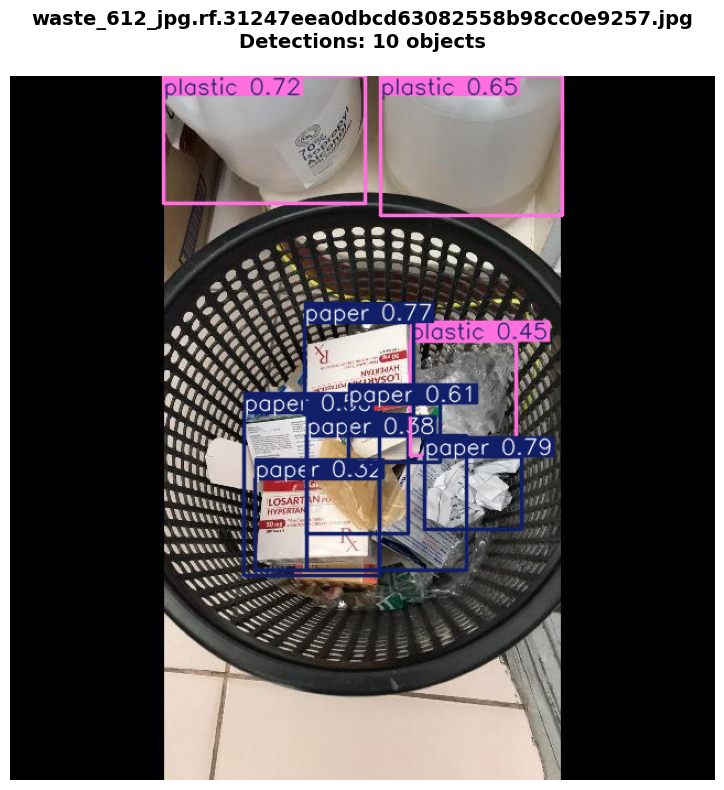



IMAGE 2/15: waste_56_jpg.rf.2c1c970f3758e5a559c4f7bd5e7c5fbf.jpg

? Found 8 objects:

Detection 1:
  ?? Class: paper
  ?? Confidence: 0.9452
  ?? Bounding Box: [95, 334, 284, 601]
Detection 2:
  ?? Class: metal
  ?? Confidence: 0.9398
  ?? Bounding Box: [242, 349, 332, 455]
Detection 3:
  ?? Class: paper
  ?? Confidence: 0.9366
  ?? Bounding Box: [388, 161, 559, 429]
Detection 4:
  ?? Class: metal
  ?? Confidence: 0.9238
  ?? Bounding Box: [133, 273, 274, 362]
Detection 5:
  ?? Class: metal
  ?? Confidence: 0.9213
  ?? Bounding Box: [329, 372, 466, 493]
Detection 6:
  ?? Class: plastic
  ?? Confidence: 0.9075
  ?? Bounding Box: [231, 445, 357, 639]
Detection 7:
  ?? Class: wrapper
  ?? Confidence: 0.8596
  ?? Bounding Box: [276, 211, 415, 378]
Detection 8:
  ?? Class: plastic
  ?? Confidence: 0.8287
  ?? Bounding Box: [81, 109, 378, 314]


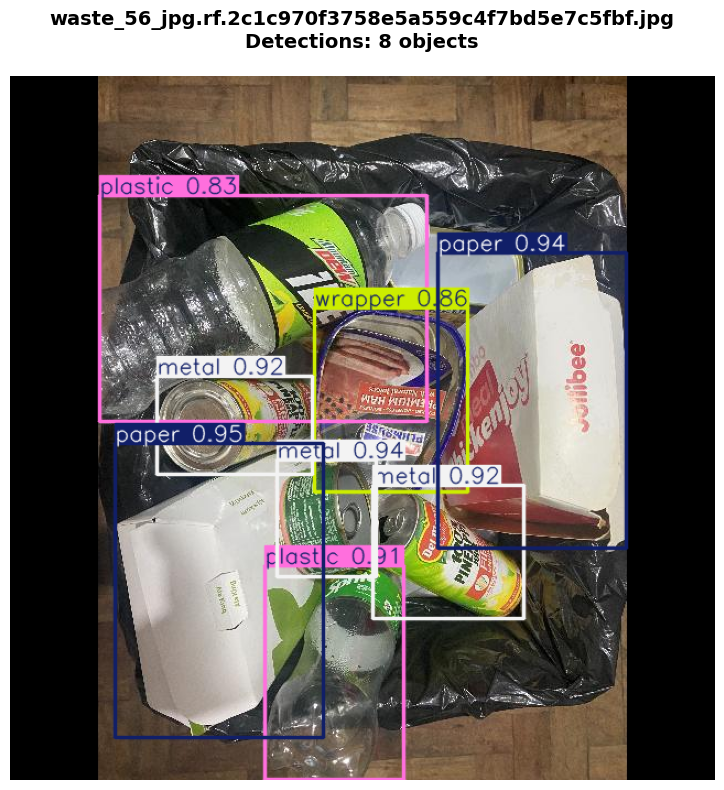



IMAGE 3/15: waste_1357_jpg.rf.28c161b4097f869bd45ca05dae585033.jpg

? Found 7 objects:

Detection 1:
  ?? Class: metal
  ?? Confidence: 0.9521
  ?? Bounding Box: [405, 154, 587, 382]
Detection 2:
  ?? Class: metal
  ?? Confidence: 0.9434
  ?? Bounding Box: [292, 165, 432, 394]
Detection 3:
  ?? Class: metal
  ?? Confidence: 0.9433
  ?? Bounding Box: [37, 183, 205, 406]
Detection 4:
  ?? Class: metal
  ?? Confidence: 0.9320
  ?? Bounding Box: [132, 339, 261, 476]
Detection 5:
  ?? Class: metal
  ?? Confidence: 0.9238
  ?? Bounding Box: [155, 134, 317, 361]
Detection 6:
  ?? Class: metal
  ?? Confidence: 0.9197
  ?? Bounding Box: [391, 354, 525, 481]
Detection 7:
  ?? Class: metal
  ?? Confidence: 0.8578
  ?? Bounding Box: [276, 349, 398, 479]


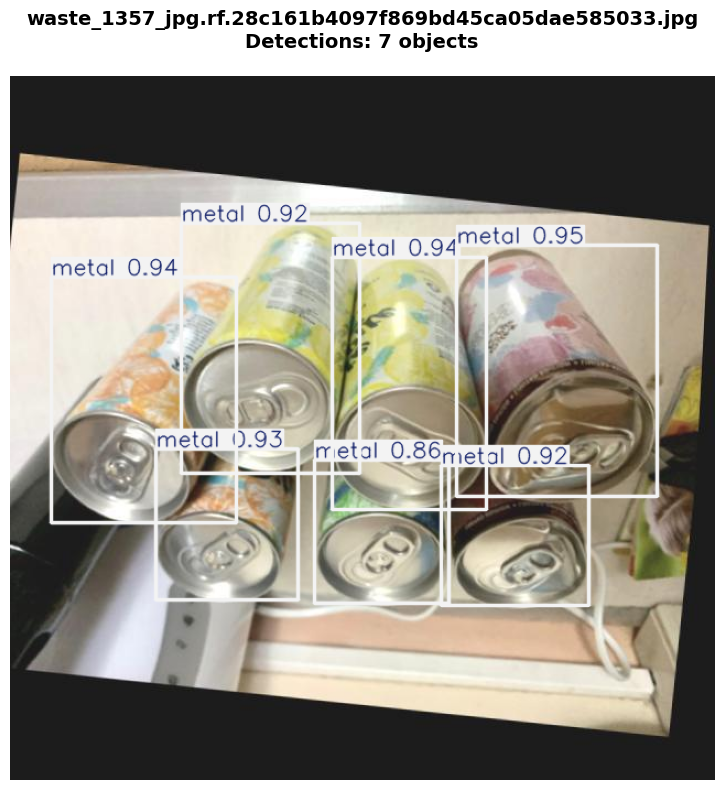



IMAGE 4/15: metal133_jpg.rf.cfc2241dfac2001fd71e2e4c1df9571e.jpg

? Found 1 objects:

Detection 1:
  ?? Class: metal
  ?? Confidence: 0.9420
  ?? Bounding Box: [99, 95, 537, 556]


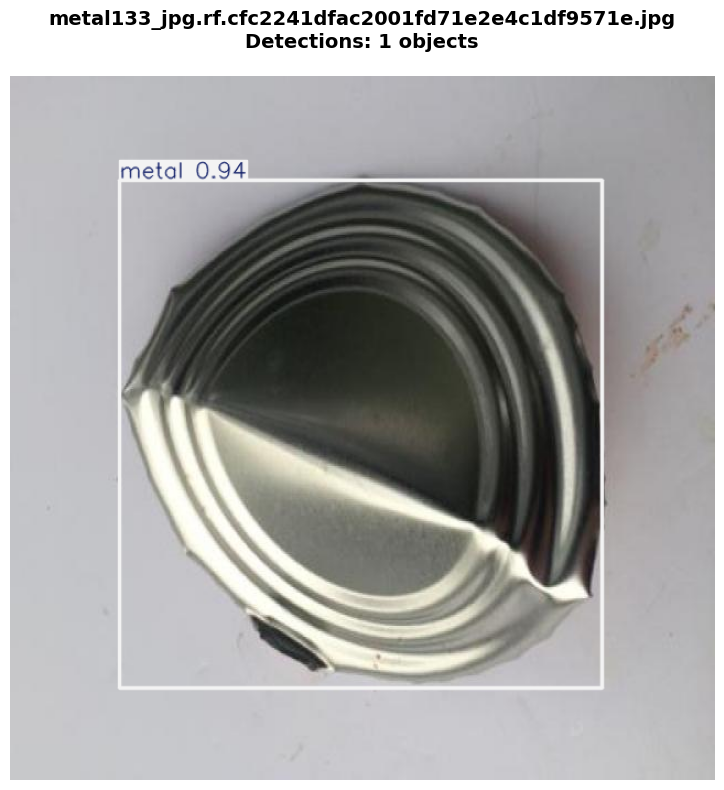



IMAGE 5/15: waste_556_jpg.rf.6bed9c4c4c2608101188bf15a02302b1.jpg

? Found 6 objects:

Detection 1:
  ?? Class: plastic
  ?? Confidence: 0.7700
  ?? Bounding Box: [223, 356, 461, 639]
Detection 2:
  ?? Class: paper
  ?? Confidence: 0.4737
  ?? Bounding Box: [181, 184, 413, 269]
Detection 3:
  ?? Class: plastic
  ?? Confidence: 0.4286
  ?? Bounding Box: [159, 333, 276, 571]
Detection 4:
  ?? Class: plastic
  ?? Confidence: 0.4173
  ?? Bounding Box: [139, 266, 276, 546]
Detection 5:
  ?? Class: wrapper
  ?? Confidence: 0.2716
  ?? Bounding Box: [373, 214, 457, 292]
Detection 6:
  ?? Class: biowaste
  ?? Confidence: 0.2541
  ?? Bounding Box: [281, 334, 327, 388]


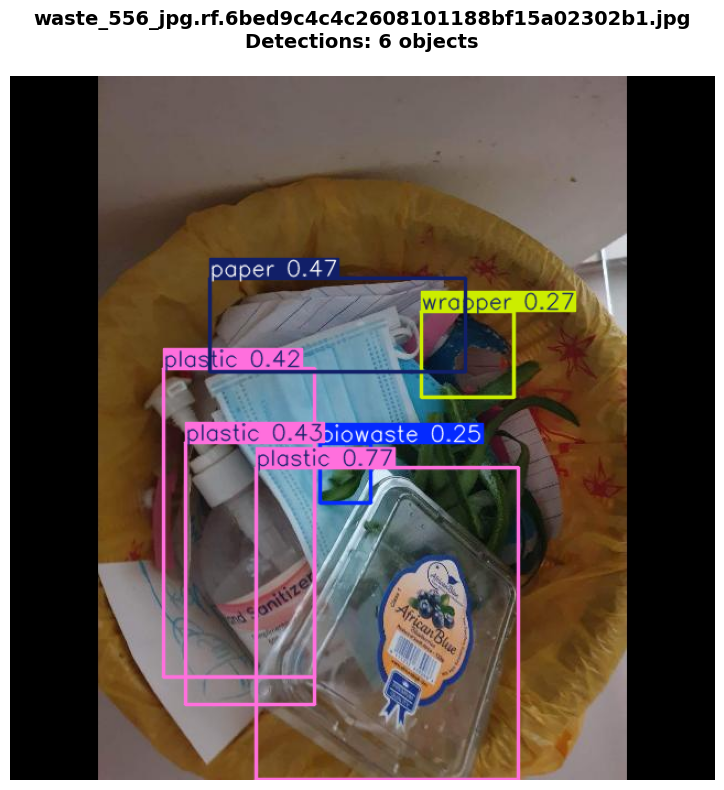



IMAGE 6/15: waste_610_jpg.rf.bd2fa1497328e11335d6a74dfa445081.jpg

? Found 7 objects:

Detection 1:
  ?? Class: paper
  ?? Confidence: 0.8350
  ?? Bounding Box: [193, 206, 351, 341]
Detection 2:
  ?? Class: paper
  ?? Confidence: 0.8023
  ?? Bounding Box: [299, 290, 408, 385]
Detection 3:
  ?? Class: paper
  ?? Confidence: 0.7952
  ?? Bounding Box: [363, 346, 451, 423]
Detection 4:
  ?? Class: paper
  ?? Confidence: 0.7173
  ?? Bounding Box: [349, 407, 422, 474]
Detection 5:
  ?? Class: paper
  ?? Confidence: 0.7090
  ?? Bounding Box: [296, 463, 356, 534]
Detection 6:
  ?? Class: paper
  ?? Confidence: 0.3661
  ?? Bounding Box: [311, 389, 374, 452]
Detection 7:
  ?? Class: paper
  ?? Confidence: 0.2630
  ?? Bounding Box: [189, 336, 327, 541]


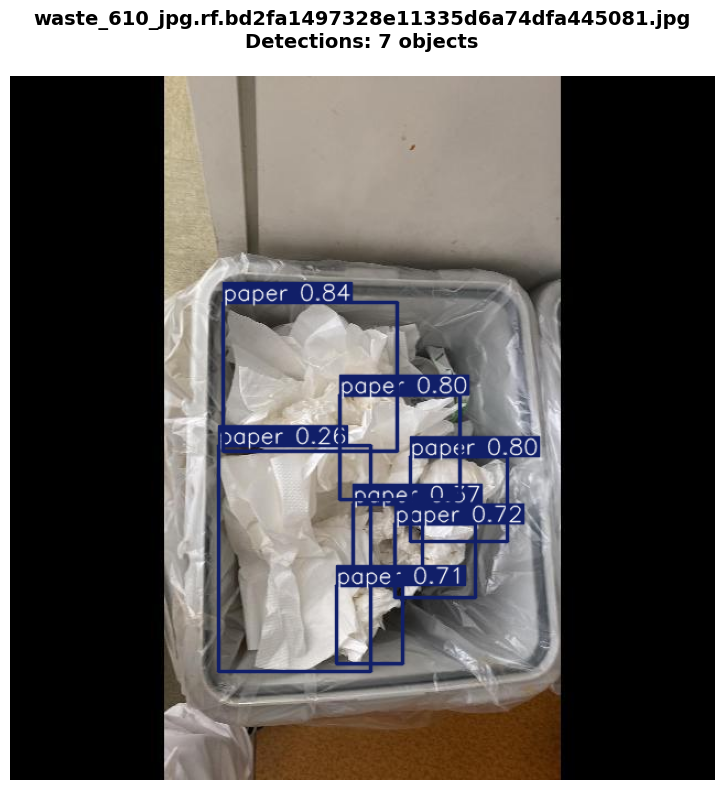



IMAGE 7/15: waste_508_jpg.rf.05b2a4219aa347f267a6e2a25850e3de.jpg

? Found 10 objects:

Detection 1:
  ?? Class: plastic
  ?? Confidence: 0.9200
  ?? Bounding Box: [201, 295, 318, 423]
Detection 2:
  ?? Class: plastic
  ?? Confidence: 0.9087
  ?? Bounding Box: [214, 42, 364, 304]
Detection 3:
  ?? Class: paper
  ?? Confidence: 0.8963
  ?? Bounding Box: [271, 417, 459, 504]
Detection 4:
  ?? Class: paper
  ?? Confidence: 0.8802
  ?? Bounding Box: [176, 417, 278, 520]
Detection 5:
  ?? Class: paper
  ?? Confidence: 0.8314
  ?? Bounding Box: [154, 137, 222, 345]
Detection 6:
  ?? Class: wrapper
  ?? Confidence: 0.8244
  ?? Bounding Box: [290, 356, 420, 426]
Detection 7:
  ?? Class: plastic
  ?? Confidence: 0.7985
  ?? Bounding Box: [300, 163, 432, 292]
Detection 8:
  ?? Class: paper
  ?? Confidence: 0.6697
  ?? Bounding Box: [313, 272, 434, 376]
Detection 9:
  ?? Class: wrapper
  ?? Confidence: 0.4562
  ?? Bounding Box: [313, 272, 434, 375]
Detection 10:
  ?? Class: paper
  ?? Confidenc

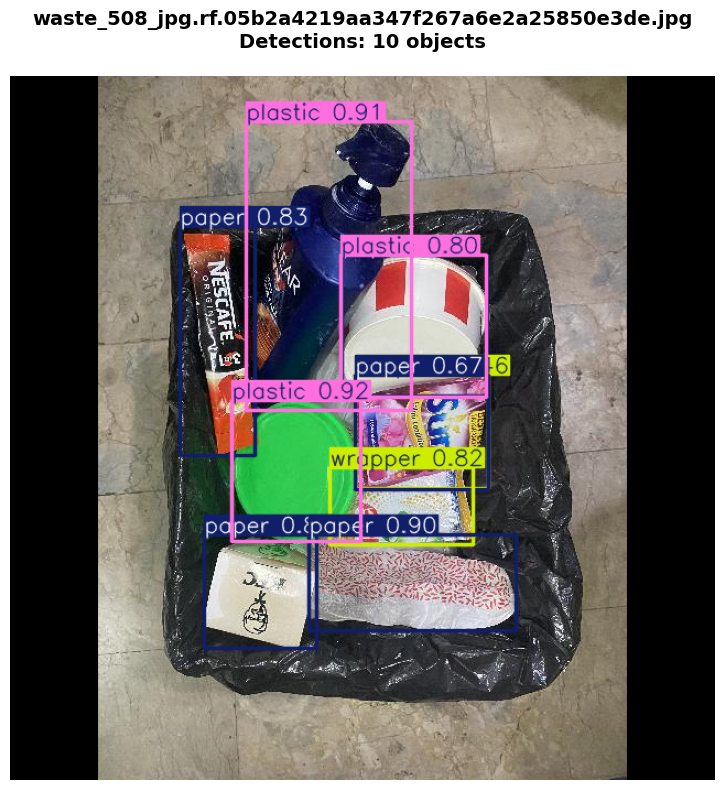



IMAGE 8/15: Pic_ad15c917-eaf3-4e33-905c-909901ef76d1_2022-09-16-09-40-am_Chikhale_jpg.rf.951135bc7ba3da0c737ba396d57484c9.jpg

? Found 1 objects:

Detection 1:
  ?? Class: plastic
  ?? Confidence: 0.7767
  ?? Bounding Box: [258, 317, 431, 402]


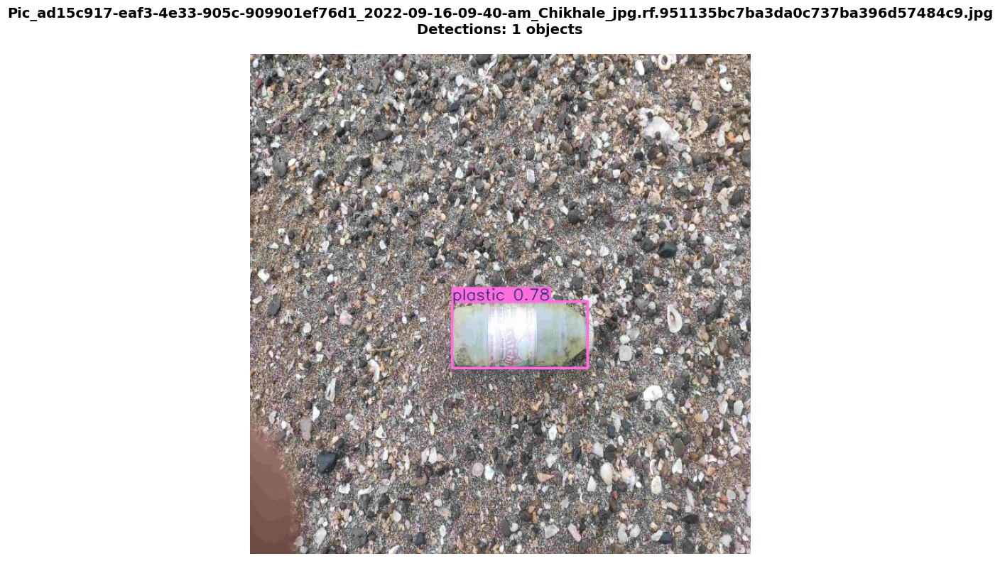



IMAGE 9/15: waste_665_jpg.rf.f45f6670086c615ec7dbc806b599447e.jpg

? Found 4 objects:

Detection 1:
  ?? Class: plastic
  ?? Confidence: 0.9026
  ?? Bounding Box: [182, 249, 296, 360]
Detection 2:
  ?? Class: paper
  ?? Confidence: 0.8472
  ?? Bounding Box: [376, 252, 435, 350]
Detection 3:
  ?? Class: paper
  ?? Confidence: 0.7926
  ?? Bounding Box: [334, 252, 399, 381]
Detection 4:
  ?? Class: paper
  ?? Confidence: 0.3592
  ?? Bounding Box: [141, 287, 191, 370]


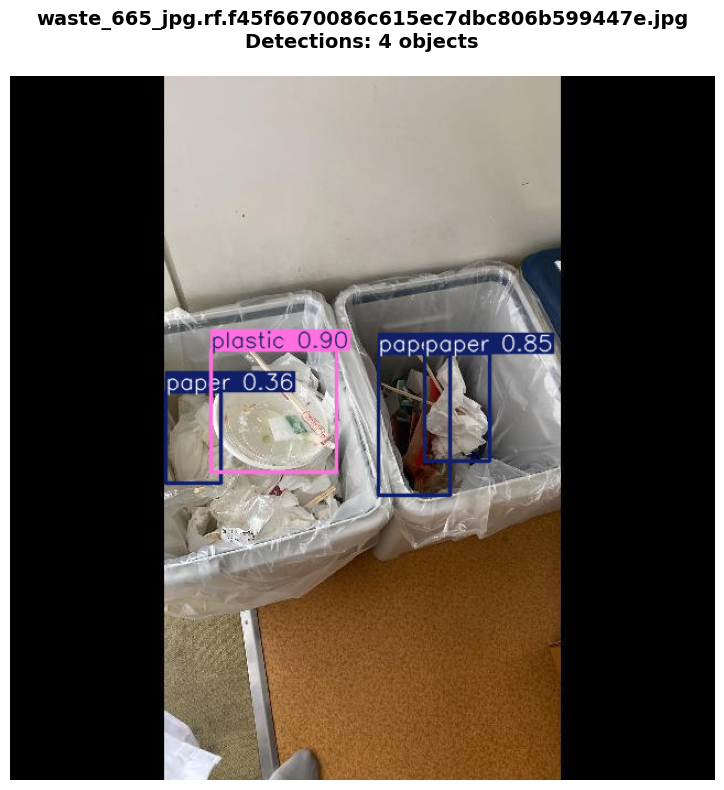



IMAGE 10/15: waste_1262_jpg.rf.8eed0861f8708bab463db8a204ed2472.jpg

? Found 4 objects:

Detection 1:
  ?? Class: wrapper
  ?? Confidence: 0.9209
  ?? Bounding Box: [103, 243, 407, 636]
Detection 2:
  ?? Class: wrapper
  ?? Confidence: 0.8495
  ?? Bounding Box: [154, 37, 406, 343]
Detection 3:
  ?? Class: wrapper
  ?? Confidence: 0.7944
  ?? Bounding Box: [369, 82, 525, 326]
Detection 4:
  ?? Class: wrapper
  ?? Confidence: 0.7686
  ?? Bounding Box: [283, 198, 380, 286]


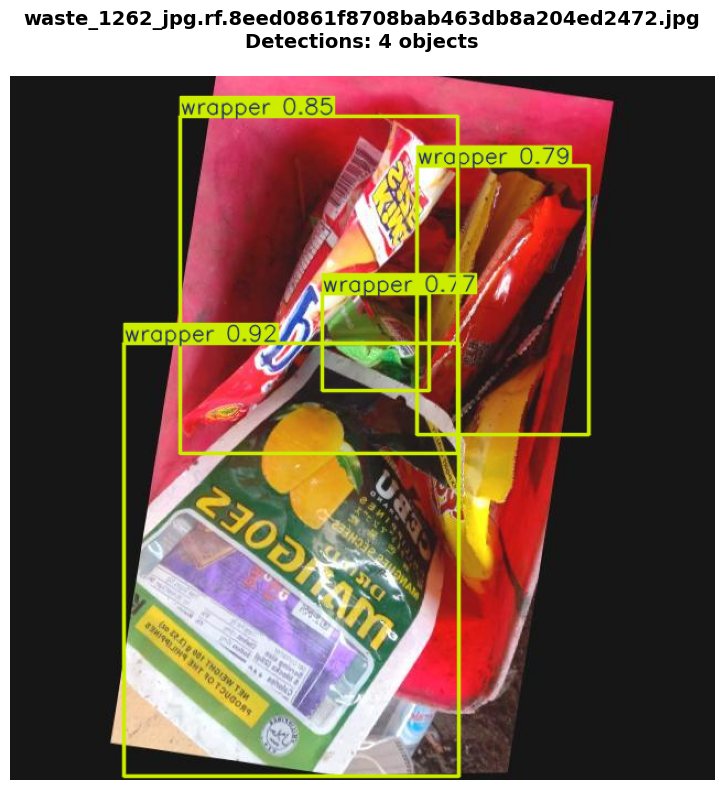



IMAGE 11/15: waste_1492_jpg.rf.78ecf8453ec728a092c4e07fd5b4a1c0.jpg

? Found 13 objects:

Detection 1:
  ?? Class: styrofoam
  ?? Confidence: 0.9205
  ?? Bounding Box: [220, 327, 363, 445]
Detection 2:
  ?? Class: styrofoam
  ?? Confidence: 0.8688
  ?? Bounding Box: [29, 117, 140, 271]
Detection 3:
  ?? Class: styrofoam
  ?? Confidence: 0.8578
  ?? Bounding Box: [483, 200, 639, 422]
Detection 4:
  ?? Class: styrofoam
  ?? Confidence: 0.8203
  ?? Bounding Box: [27, 316, 106, 397]
Detection 5:
  ?? Class: styrofoam
  ?? Confidence: 0.8168
  ?? Bounding Box: [88, 204, 232, 306]
Detection 6:
  ?? Class: styrofoam
  ?? Confidence: 0.8145
  ?? Bounding Box: [288, 191, 446, 343]
Detection 7:
  ?? Class: styrofoam
  ?? Confidence: 0.7948
  ?? Bounding Box: [409, 321, 569, 433]
Detection 8:
  ?? Class: styrofoam
  ?? Confidence: 0.7576
  ?? Bounding Box: [433, 199, 561, 338]
Detection 9:
  ?? Class: styrofoam
  ?? Confidence: 0.5518
  ?? Bounding Box: [278, 338, 407, 389]
Detection 10:
  ?? C

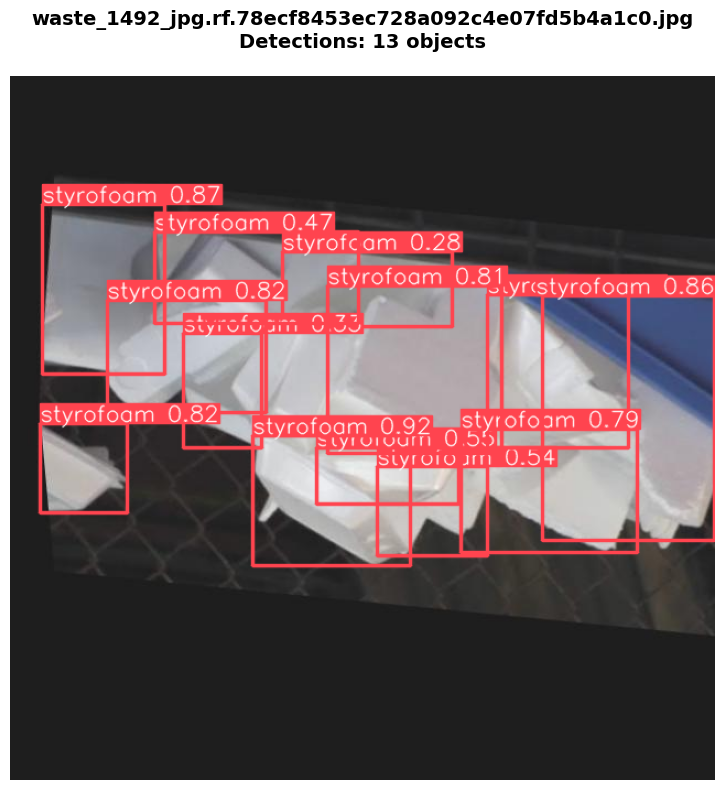



IMAGE 12/15: glass73_jpg.rf.d685560370fbd23891d1f22909cc96b2.jpg

? Found 1 objects:

Detection 1:
  ?? Class: glass
  ?? Confidence: 0.9337
  ?? Bounding Box: [224, 194, 639, 534]


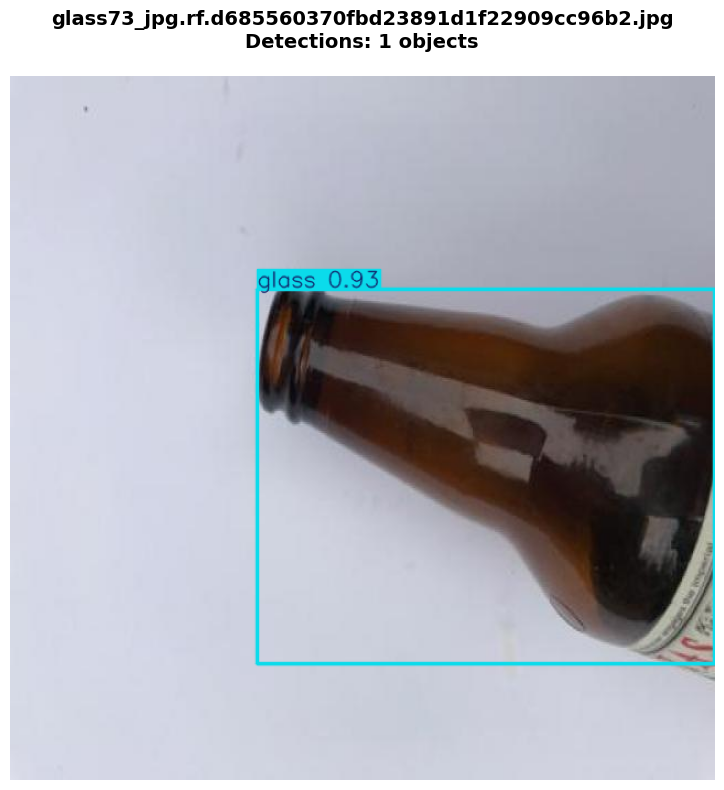



IMAGE 13/15: metal681_jpg.rf.2621cecb8f2ff5c8968eb8ff700b8853.jpg

? Found 1 objects:

Detection 1:
  ?? Class: metal
  ?? Confidence: 0.9320
  ?? Bounding Box: [155, 69, 486, 571]


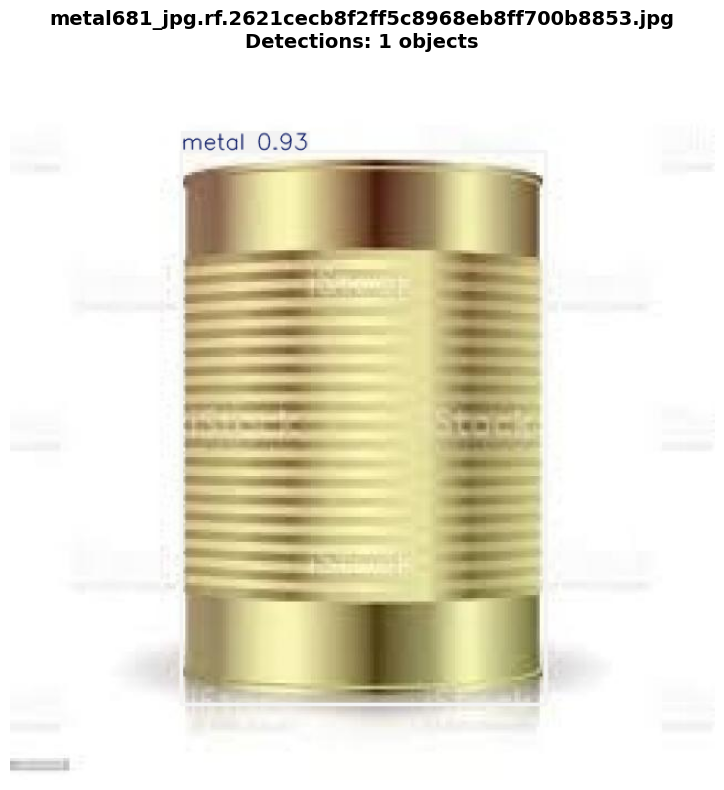



IMAGE 14/15: IMG_1205_JPG.rf.9f2cf95f69625359ba0c56800f44d0dc.jpg

? Found 32 objects:

Detection 1:
  ?? Class: wrapper
  ?? Confidence: 0.8355
  ?? Bounding Box: [347, 459, 402, 503]
Detection 2:
  ?? Class: plastic
  ?? Confidence: 0.7493
  ?? Bounding Box: [146, 454, 229, 523]
Detection 3:
  ?? Class: plastic
  ?? Confidence: 0.6642
  ?? Bounding Box: [181, 298, 256, 359]
Detection 4:
  ?? Class: paper
  ?? Confidence: 0.6518
  ?? Bounding Box: [0, 378, 26, 399]
Detection 5:
  ?? Class: paper
  ?? Confidence: 0.5896
  ?? Bounding Box: [160, 343, 200, 384]
Detection 6:
  ?? Class: paper
  ?? Confidence: 0.5866
  ?? Bounding Box: [160, 356, 199, 384]
Detection 7:
  ?? Class: paper
  ?? Confidence: 0.4950
  ?? Bounding Box: [4, 448, 41, 478]
Detection 8:
  ?? Class: plastic
  ?? Confidence: 0.4852
  ?? Bounding Box: [206, 342, 271, 396]
Detection 9:
  ?? Class: plastic
  ?? Confidence: 0.4757
  ?? Bounding Box: [182, 414, 226, 459]
Detection 10:
  ?? Class: paper
  ?? Confidence: 0.

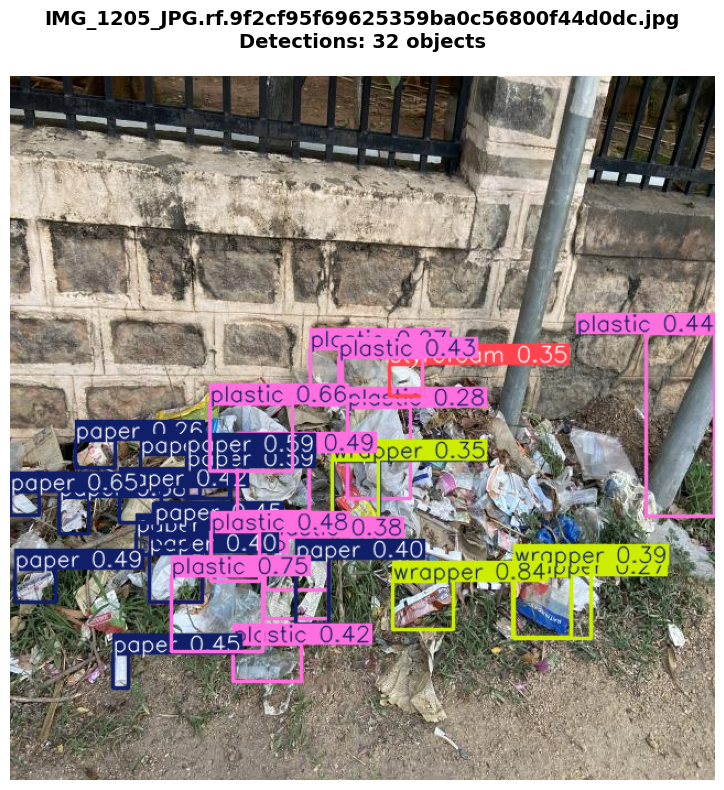



IMAGE 15/15: glass187_jpg.rf.2c84fd14d6cb32057f2b4948ee7da182.jpg

? Found 1 objects:

Detection 1:
  ?? Class: glass
  ?? Confidence: 0.9241
  ?? Bounding Box: [101, 197, 368, 403]


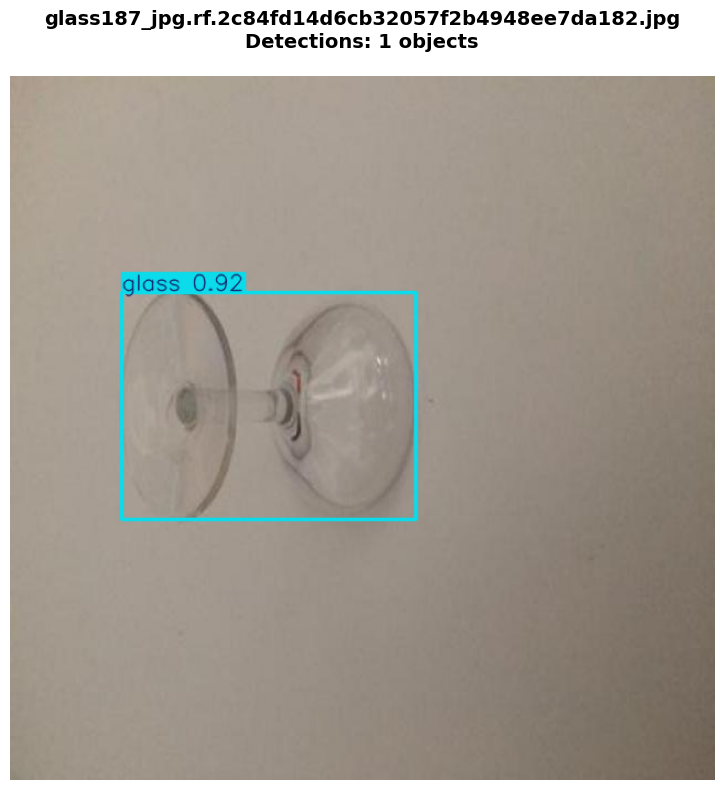



? ALL VALIDATION IMAGES DISPLAYED



In [2]:
# ==================================================
# FORCE DISPLAY IMAGES IN JUPYTER OUTPUT
# ==================================================
import cv2
import matplotlib.pyplot as plt
import os
from ultralytics import YOLO
from IPython.display import display, Image as IPImage
import numpy as np

# Enable inline plotting
%matplotlib inline

dataset_location = "/home/exouser/Trash_detection_yolo/MultiTrash-8"
best_model_path = "runs/detect/trash_detection/weights/best.pt"
class_names = ['biowaste', 'glass', 'metal', 'other', 'paper', 'plastic', 'styrofoam', 'wrapper']

# Load model
model = YOLO(best_model_path)

print(f"\n{'='*50}")
print("DISPLAYING VALIDATION RESULTS")
print(f"{'='*50}\n")

# Get test images
test_images_dir = f"{dataset_location}/valid/images"
test_images = [f for f in os.listdir(test_images_dir) 
               if f.endswith(('.jpg', '.jpeg', '.png'))][:15]

# Test and display each image separately
for idx, img_file in enumerate(test_images):
    img_path = os.path.join(test_images_dir, img_file)
    
    print(f"\n{'='*60}")
    print(f"IMAGE {idx+1}/{len(test_images)}: {img_file}")
    print(f"{'='*60}\n")
    
    # Run inference
    results = model(img_path, conf=0.25, verbose=False)
    result = results[0]
    
    # Get predictions
    boxes = result.boxes
    
    if len(boxes) > 0:
        print(f"? Found {len(boxes)} objects:\n")
        
        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            class_name = class_names[cls]
            
            print(f"Detection {i+1}:")
            print(f"  ?? Class: {class_name}")
            print(f"  ?? Confidence: {conf:.4f}")
            print(f"  ?? Bounding Box: [{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}]")
    else:
        print("No detections found")
    
    # Get annotated image
    result_img = result.plot()
    result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    
    # Display with matplotlib
    plt.figure(figsize=(12, 8))
    plt.imshow(result_rgb)
    plt.axis('off')
    plt.title(f"{img_file}\nDetections: {len(boxes)} objects", 
              fontsize=14, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    print()

print(f"\n{'='*60}")
print("? ALL VALIDATION IMAGES DISPLAYED")
print(f"{'='*60}\n")

# ==================================================
# FUNCTION TO TEST YOUR CUSTOM IMAGE
# ==================================================

def test_custom_image(image_path, conf_threshold=0.25):
    """
    Test and display your custom image
    """
    
    print(f"\n{'='*60}")
    print(f"TESTING CUSTOM IMAGE")
    print(f"{'='*60}\n")
    
    if not os.path.exists(image_path):
        print(f"? ERROR: Image not found!")
        print(f"Looking for: {image_path}")
        print(f"\nCurrent directory: {os.getcwd()}")
        print(f"\nFiles in current directory:")
        for f in os.listdir('.')[:20]:
            print(f"  - {f}")
        return None
    
    print(f"?? Image: {os.path.basename(image_path)}")
    print(f"?? Confidence threshold: {conf_threshold}\n")
    
    # Run inference
    results = model(image_path, conf=conf_threshold, verbose=False)
    result = results[0]
    
    # Get predictions
    boxes = result.boxes
    detections = []
    
    print(f"{'='*60}")
    print("DETECTIONS")
    print(f"{'='*60}\n")
    
    if len(boxes) > 0:
        print(f"? Found {len(boxes)} objects:\n")
        
        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            class_name = class_names[cls]
            
            detection = {
                'class_id': cls,
                'class_name': class_name,
                'confidence': float(conf),
                'bbox': [int(x1), int(y1), int(x2), int(y2)]
            }
            detections.append(detection)
            
            print(f"Detection {i+1}:")
            print(f"  ?? Class: {class_name}")
            print(f"  ?? Confidence: {conf:.4f} ({conf*100:.1f}%)")
            print(f"  ?? Bounding Box: [{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}]")
            print()
    else:
        print("? No objects detected")
        print(f"?? Try lowering threshold (current: {conf_threshold})")
        print("   Example: test_custom_image('your_image.jpg', conf_threshold=0.15)")
    
    # Get annotated image
    result_img = result.plot()
    result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    
    # Create summary
    class_counts = {}
    if detections:
        for det in detections:
            cls = det['class_name']
            class_counts[cls] = class_counts.get(cls, 0) + 1
        
        summary = " | ".join([f"{cls}: {cnt}" for cls, cnt in class_counts.items()])
    else:
        summary = "No detections"
    
    # Display image
    plt.figure(figsize=(14, 10))
    plt.imshow(result_rgb)
    plt.axis('off')
    plt.title(f"{os.path.basename(image_path)}\nTotal: {len(boxes)} objects | {summary}", 
              fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    # Save outputs
    base_name = os.path.splitext(os.path.basename(image_path))[0]
    output_filename = f"result_{base_name}.jpg"
    cv2.imwrite(output_filename, result_img)
    
    print(f"\n{'='*60}")
    print("SUMMARY")
    print(f"{'='*60}")
    print(f"Total detections: {len(detections)}")
    if class_counts:
        print("\nBy class:")
        for cls, count in class_counts.items():
            print(f"  ? {cls}: {count}")
    print(f"\n? Result saved to: {output_filename}")
    print(f"{'='*60}\n")
    
    return detections


In [30]:
# ==================================================
# COMPLETE SINGLE-CELL TRASH DETECTION WITH UPLOAD
# ==================================================
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import io
import json
from ultralytics import YOLO
from ipywidgets import FileUpload, Output, VBox
from IPython.display import display, clear_output

%matplotlib inline

# Load model
best_model_path = "runs/detect/trash_detection/weights/best.pt"
class_names = ['biowaste', 'glass', 'metal', 'other', 'paper', 'plastic', 'styrofoam', 'wrapper']
model = YOLO(best_model_path)

print("? Model loaded successfully!\n")

# Create upload widget and output area
upload_widget = FileUpload(accept='image/*', multiple=False)
output_widget = Output()

def process_upload(change):
    """Automatically process uploaded image"""
    
    with output_widget:
        clear_output(wait=True)
        
        # Check if file uploaded
        if not change['new']:
            return
        
        try:
            print(f"\n{'='*60}")
            print("?? PROCESSING UPLOADED IMAGE...")
            print(f"{'='*60}\n")
            
            # Get uploaded file data
            uploaded_data = change['new']
            
            # Handle different upload formats
            if isinstance(uploaded_data, dict):
                # Dictionary format
                filename = list(uploaded_data.keys())[0]
                file_content = uploaded_data[filename]['content']
            elif isinstance(uploaded_data, tuple) and len(uploaded_data) > 0:
                # Tuple format
                file_info = uploaded_data[0]
                filename = file_info.get('name', 'uploaded_image.jpg')
                file_content = file_info['content']
            else:
                print("? Unexpected upload format")
                return
            
            print(f"?? File: {filename}")
            
            # Convert to image
            pil_image = Image.open(io.BytesIO(file_content))
            img_array = np.array(pil_image.convert('RGB'))
            
            print(f"?? Image size: {img_array.shape[1]} x {img_array.shape[0]} pixels")
            print("?? Confidence threshold: 0.25")
            print("\n?? Running detection...\n")
            
            # Save temporarily
            temp_path = 'temp_upload.jpg'
            cv2.imwrite(temp_path, cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR))
            
            # Run detection
            results = model(temp_path, conf=0.25, verbose=False)
            result = results[0]
            boxes = result.boxes
            
            # Process detections
            print(f"{'='*60}")
            print(f"? DETECTION RESULTS: {len(boxes)} OBJECT(S) FOUND")
            print(f"{'='*60}\n")
            
            detections = []
            class_counts = {}
            
            if len(boxes) > 0:
                for i, box in enumerate(boxes):
                    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                    conf = box.conf[0].cpu().numpy()
                    cls = int(box.cls[0].cpu().numpy())
                    class_name = class_names[cls]
                    
                    detection = {
                        'class_name': class_name,
                        'confidence': float(conf),
                        'bbox': [int(x1), int(y1), int(x2), int(y2)]
                    }
                    detections.append(detection)
                    class_counts[class_name] = class_counts.get(class_name, 0) + 1
                    
                    print(f"???  Detection {i+1}:")
                    print(f"    ?? Class: {class_name.upper()}")
                    print(f"    ?? Confidence: {conf:.4f} ({conf*100:.1f}%)")
                    print(f"    ?? Bounding Box: [{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}]")
                    print()
                
                # Summary
                print(f"{'='*60}")
                print("?? SUMMARY BY CLASS")
                print(f"{'='*60}")
                for cls in sorted(class_counts.keys()):
                    count = class_counts[cls]
                    percentage = (count / len(boxes)) * 100
                    print(f"  ? {cls.capitalize()}: {count} ({percentage:.1f}%)")
                print()
                
            else:
                print("? No objects detected in this image")
                print("?? The image may not contain trash, or objects have low confidence")
                print("   Try with a clearer image or different angle\n")
            
            # Create visualization
            result_img = result.plot()
            result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
            
            # Display side-by-side
            fig, axes = plt.subplots(1, 2, figsize=(18, 8))
            
            # Original image
            axes[0].imshow(img_array)
            axes[0].axis('off')
            axes[0].set_title('?? Original Image', fontsize=16, fontweight='bold', pad=15)
            
            # Detected image
            axes[1].imshow(result_rgb)
            axes[1].axis('off')
            
            title = f'?? Detected: {len(boxes)} Objects'
            if class_counts:
                subtitle = ' | '.join([f"{cls.capitalize()}: {cnt}" for cls, cnt in sorted(class_counts.items())])
                title += f'\n{subtitle}'
            axes[1].set_title(title, fontsize=16, fontweight='bold', pad=15)
            
            plt.tight_layout()
            plt.show()
            
            # Save outputs
            output_image = 'detection_result.jpg'
            cv2.imwrite(output_image, result_img)
            print(f"\n?? Result image saved: {output_image}")
            
            if detections:
                output_json = 'detection_results.json'
                with open(output_json, 'w') as f:
                    json.dump({
                        'filename': filename,
                        'image_size': f"{img_array.shape[1]}x{img_array.shape[0]}",
                        'num_detections': len(detections),
                        'confidence_threshold': 0.25,
                        'class_summary': class_counts,
                        'detections': detections
                    }, f, indent=2)
                print(f"?? JSON results saved: {output_json}")
            
            print(f"\n{'='*60}")
            print("? DETECTION COMPLETE!")
            print(f"{'='*60}\n")
            
        except Exception as e:
            print(f"? Error processing image: {e}")
            import traceback
            traceback.print_exc()

# Connect upload widget to processing function
upload_widget.observe(process_upload, names='value')

# Display interface
print("="*60)
print("???  TRASH DETECTION SYSTEM")
print("="*60)
print("\n?? Instructions:")
print("  1. Click the 'Upload' button below")
print("  2. Select an image containing trash")
print("  3. Detection will run automatically!")
print("  4. View results with bounding boxes and confidence scores")
print("\n" + "="*60 + "\n")

# Display widgets
display(VBox([upload_widget, output_widget]))

print("\n??  Click 'Upload' button above to start! ??")

? Model loaded successfully!

???  TRASH DETECTION SYSTEM

?? Instructions:
  1. Click the 'Upload' button below
  2. Select an image containing trash
  3. Detection will run automatically!
  4. View results with bounding boxes and confidence scores





??  Click 'Upload' button above to start! ??


In [31]:
from ultralytics import YOLO
import os
import shutil

best_model_path = "runs/detect/trash_detection/weights/best.pt"  # Your trained model

print("="*60)
print("?? EXPORTING MODEL TO MULTIPLE FORMATS")
print("="*60)

# Load your trained model
model = YOLO(best_model_path)

print("\nModel loaded successfully!")
print(f"Source: {best_model_path}\n")

?? EXPORTING MODEL TO MULTIPLE FORMATS

Model loaded successfully!
Source: runs/detect/trash_detection/weights/best.pt



In [32]:
print("="*60)
print("1??  EXPORTING TO ONNX FORMAT")
print("="*60)

try:
    onnx_path = model.export(format='onnx', simplify=True, dynamic=False)
    
    if os.path.exists(onnx_path):
        print(f"\n? ONNX export successful!")
        print(f"?? Location: {onnx_path}")
        print(f"?? File size: {os.path.getsize(onnx_path) / (1024*1024):.2f} MB")
        
        # Copy to current directory for easy access
        onnx_output = "trash_detection_model.onnx"
        shutil.copy(onnx_path, onnx_output)
        print(f"?? Copied to: {onnx_output}")
    else:
        print("? ONNX export failed")
        
except Exception as e:
    print(f"? ONNX export error: {e}")

print()

# ==================================================
# 2. EXPORT TO TFLITE (ALTERNATIVE METHOD)
# ==================================================

print("="*60)
print("2??  EXPORTING TO TFLITE FORMAT")
print("="*60)

# Method 1: Direct TFLite export
try:
    print("\nMethod 1: Direct TFLite export...")
    tflite_path = model.export(format='tflite', int8=False)
    
    if os.path.exists(tflite_path):
        print(f"\n? TFLite export successful!")
        print(f"?? Location: {tflite_path}")
        print(f"?? File size: {os.path.getsize(tflite_path) / (1024*1024):.2f} MB")
        
        # Copy to current directory
        tflite_output = "trash_detection_model.tflite"
        shutil.copy(tflite_path, tflite_output)
        print(f"?? Copied to: {tflite_output}")
    else:
        print("?? Direct TFLite export didn't work, trying alternative method...")
        raise Exception("Try alternative method")
        
except Exception as e:
    print(f"\n?? Direct TFLite export issue: {e}")
    print("\nTrying Method 2: Export via SavedModel...")
    
    # Method 2: Export to SavedModel first, then convert to TFLite
    try:
        # Export to SavedModel
        saved_model_path = model.export(format='saved_model')
        print(f"? SavedModel exported: {saved_model_path}")
        
        # Convert SavedModel to TFLite using TensorFlow
        import tensorflow as tf
        
        converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_path)
        converter.optimizations = [tf.lite.Optimize.DEFAULT]
        tflite_model = converter.convert()
        
        # Save TFLite model
        tflite_output = "trash_detection_model.tflite"
        with open(tflite_output, 'wb') as f:
            f.write(tflite_model)
        
        print(f"\n? TFLite export successful (via SavedModel)!")
        print(f"?? Location: {tflite_output}")
        print(f"?? File size: {os.path.getsize(tflite_output) / (1024*1024):.2f} MB")
        
    except Exception as e2:
        print(f"? Method 2 also failed: {e2}")
        print("\nTrying Method 3: Using ONNX as intermediate...")
        
        # Method 3: ONNX ? TFLite conversion
        try:
            import onnx
            from onnx_tf.backend import prepare
            
            # Load ONNX model
            if 'onnx_path' in locals() and os.path.exists(onnx_path):
                onnx_model = onnx.load(onnx_path)
                tf_rep = prepare(onnx_model)
                
                # Export to SavedModel
                saved_model_dir = "temp_saved_model"
                tf_rep.export_graph(saved_model_dir)
                
                # Convert to TFLite
                converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
                tflite_model = converter.convert()
                
                tflite_output = "trash_detection_model.tflite"
                with open(tflite_output, 'wb') as f:
                    f.write(tflite_model)
                
                print(f"\n? TFLite export successful (via ONNX)!")
                print(f"?? Location: {tflite_output}")
                
        except Exception as e3:
            print(f"? Method 3 failed: {e3}")
            print("\n?? TFLite conversion has compatibility issues.")
            print("Recommendation: Use ONNX format instead (more stable)")

print()


1??  EXPORTING TO ONNX FORMAT
Ultralytics 8.3.230 🚀 Python-3.12.5 torch-2.4.0+cu121 CPU (AMD EPYC-Milan Processor)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'runs/detect/trash_detection/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 12, 8400) (6.0 MB)

ONNX: starting export with onnx 1.19.1 opset 19...
ONNX: slimming with onnxslim 0.1.74...
ONNX: export success ✅ 0.8s, saved as 'runs/detect/trash_detection/weights/best.onnx' (11.7 MB)

Export complete (1.1s)
Results saved to /home/exouser/Trash_detection_yolo/runs/detect/trash_detection/weights
Predict:         yolo predict task=detect model=runs/detect/trash_detection/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/trash_detection/weights/best.onnx imgsz=640 data=/home/exouser/Trash_detection_yolo/MultiTrash-8/data.yaml  
Visualize:       https://netron.app

? ONNX export successful!
?? Location: runs/de

TENSORBOARD IN JUPYTER LAB
? TensorBoard extension loaded

? Found training directory: runs/detect/trash_detection

Files in training directory:
  - train_batch1.jpg
  - BoxR_curve.png
  - results.csv
  - BoxP_curve.png
  - val_batch2_labels.jpg
  - val_batch0_labels.jpg
  - train_batch12801.jpg
  - val_batch2_pred.jpg
  - confusion_matrix.png
  - train_batch12800.jpg
  - val_batch1_pred.jpg
  - weights
  - results.png
  - confusion_matrix_normalized.png
  - val_batch0_pred.jpg
  - BoxF1_curve.png
  - train_batch2.jpg
  - val_batch1_labels.jpg
  - train_batch12802.jpg
  - args.yaml
  - labels.jpg
  - train_batch0.jpg
  - BoxPR_curve.png

LAUNCHING TENSORBOARD

Log directory: runs/detect/trash_detection

? Starting TensorBoard...



? TensorBoard is running above!

You should see training graphs including:
  ? train/box_loss - Bounding box loss
  ? train/cls_loss - Classification loss
  ? train/dfl_loss - Distribution focal loss
  ? metrics/precision(B) - Precision
  ? metrics/recall(B) - Recall
  ? metrics/mAP50(B) - Mean Average Precision @ IoU 0.5
  ? metrics/mAP50-95(B) - Mean Average Precision @ IoU 0.5-0.95


ALTERNATIVE: VIEW TRAINING PLOTS DIRECTLY

Showing training plots...

?? Training Results (Loss & Metrics):


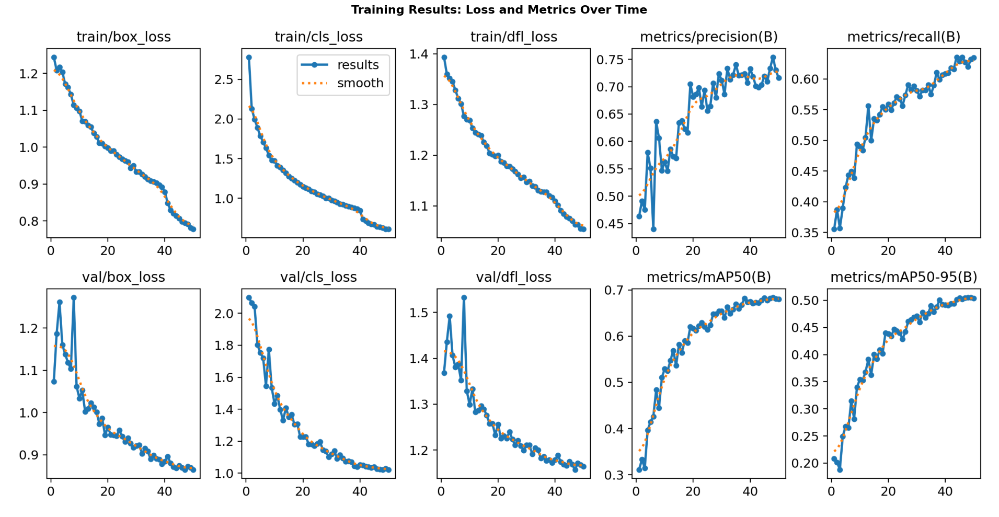


?? Confusion Matrix:


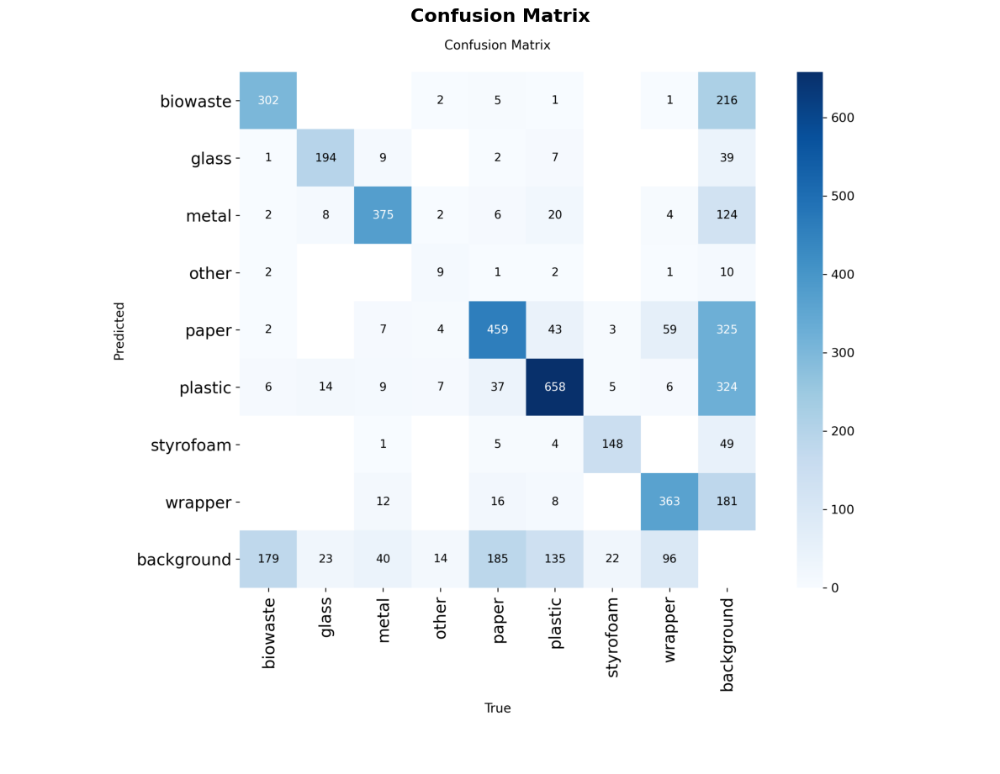


?? Normalized Confusion Matrix:


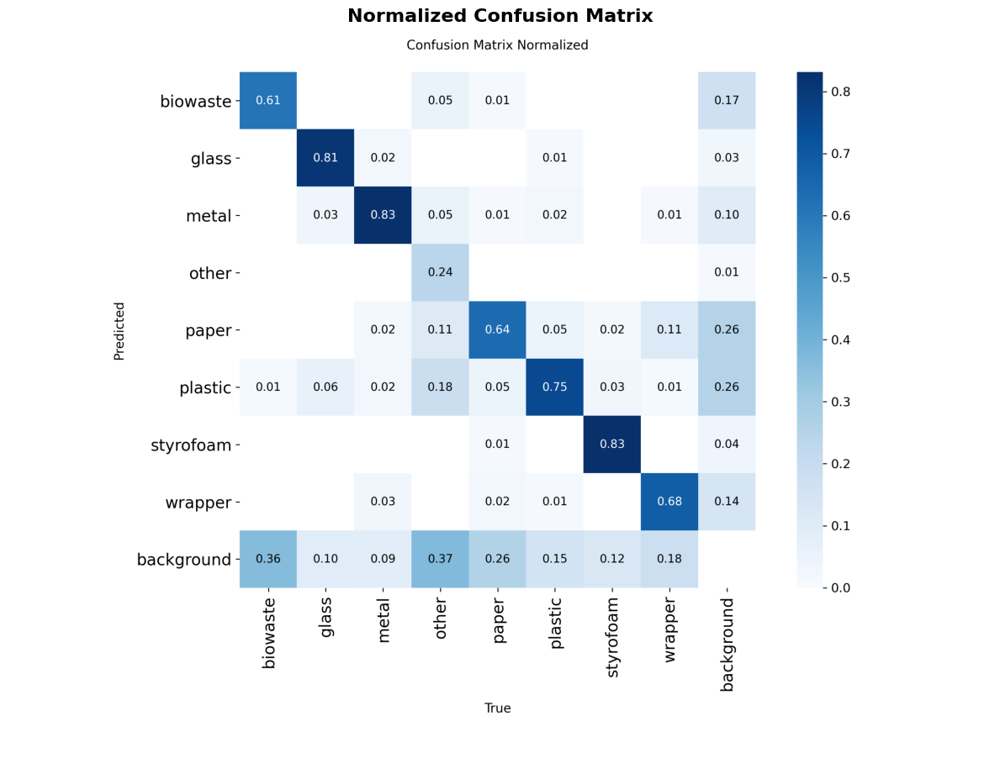


?? Other Training Visualizations:

Found 4 additional visualizations

?? train_batch0.jpg:


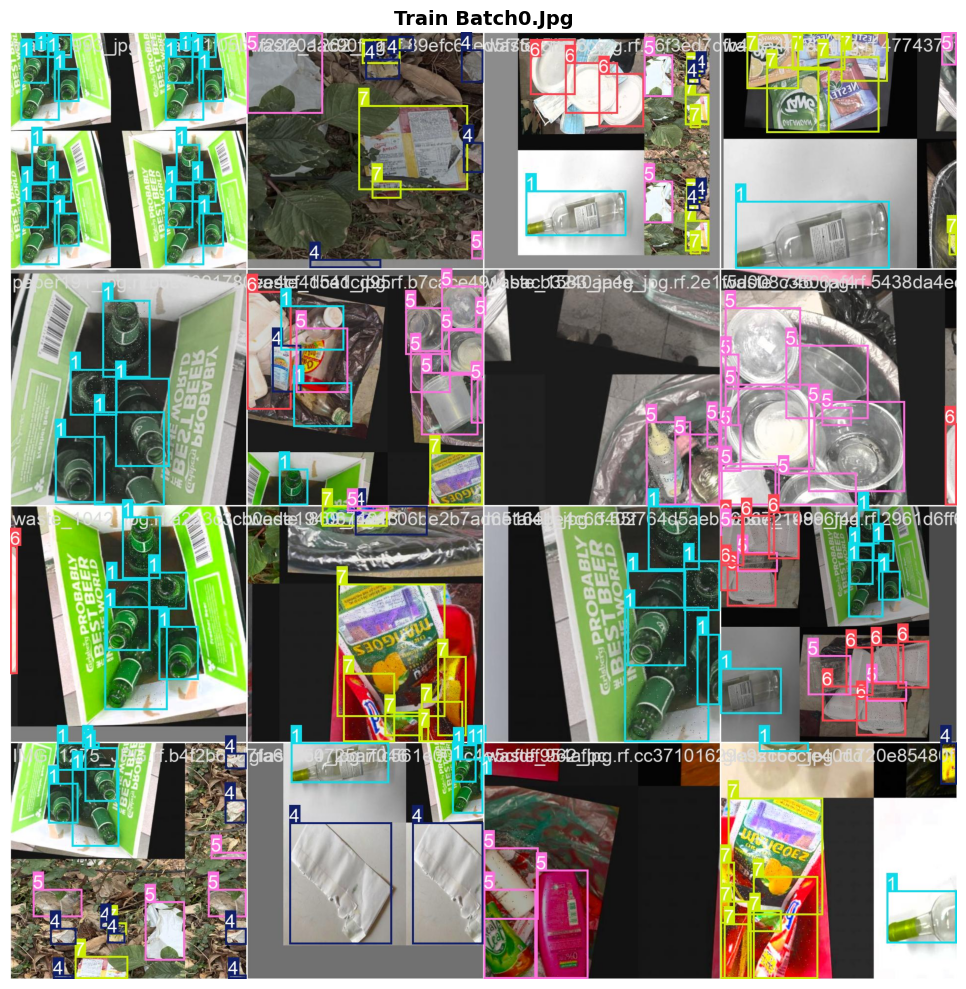


?? val_batch0_labels.jpg:


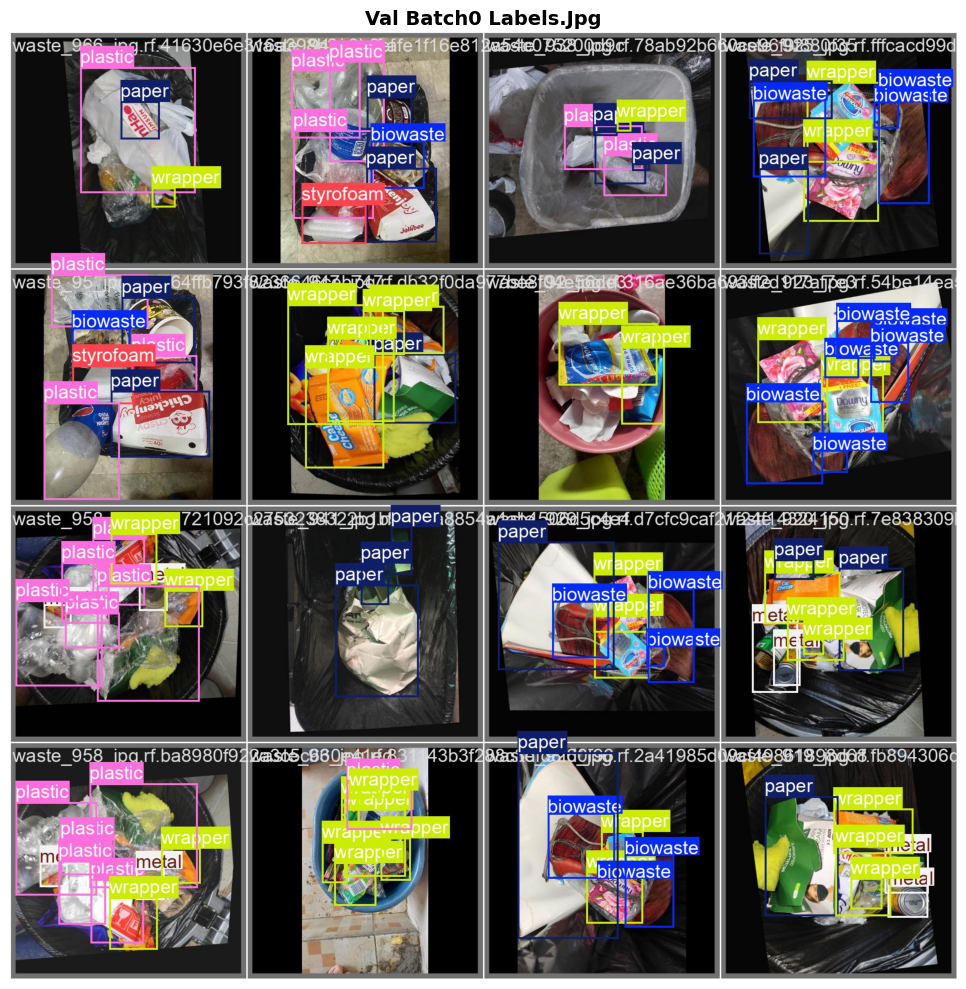


?? val_batch0_pred.jpg:


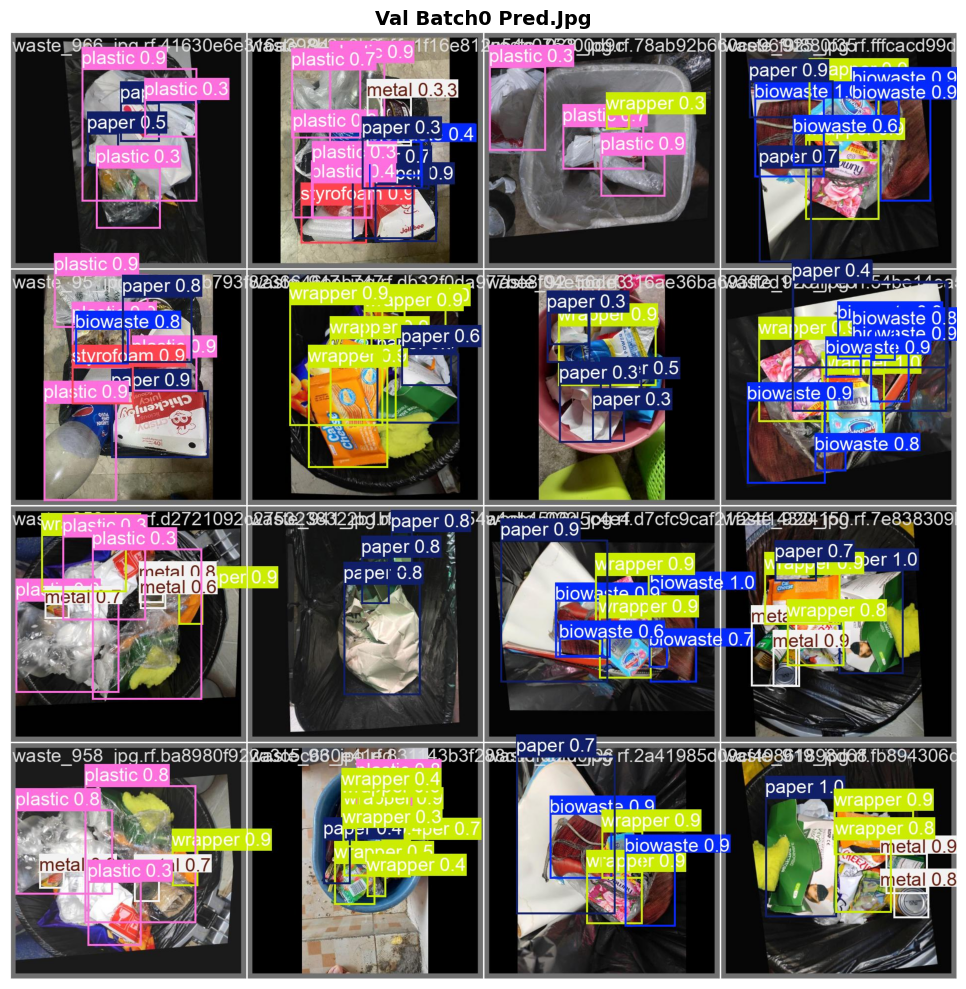



TRAINING METRICS SUMMARY

?? Training Progress (Last 10 epochs):
----------------------------------------------------------------------
 epoch  train/box_loss  train/cls_loss  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  metrics/mAP50-95(B)
    41         0.84826         0.73835               0.71869            0.60992           0.67166              0.49119
    42         0.83000         0.71489               0.70149            0.61808           0.67321              0.49361
    43         0.82095         0.69297               0.69894            0.61639           0.67174              0.49369
    44         0.81338         0.67754               0.70372            0.63585           0.67723              0.50124
    45         0.80698         0.66748               0.71925            0.62905           0.68243              0.50420
    46         0.79788         0.64618               0.70956            0.63561           0.67766              0.50203
    47         0.79509       

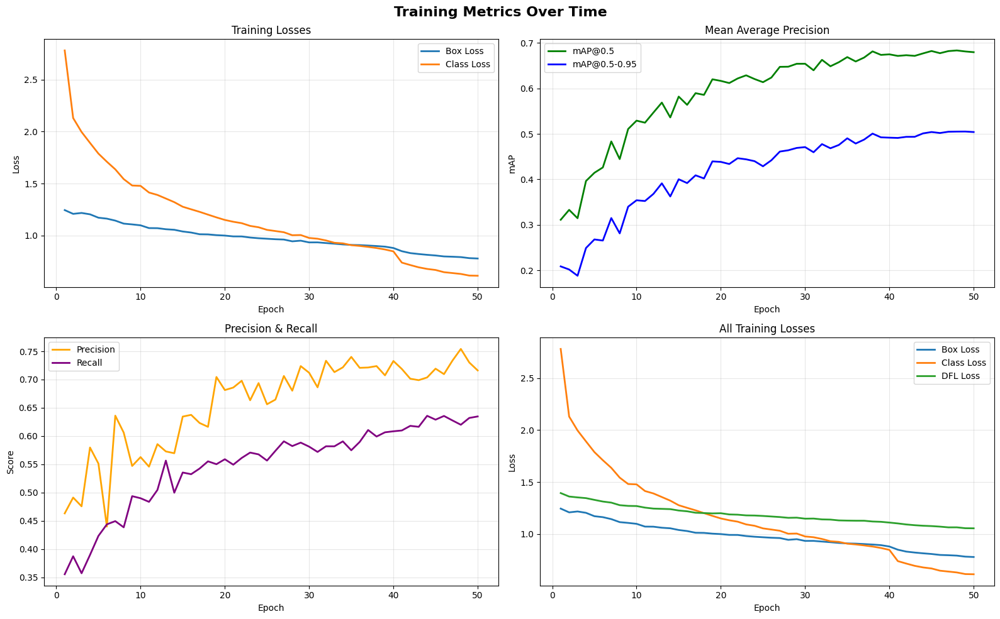


? All visualizations displayed!

?? TensorBoard Tips:
----------------------------------------------------------------------
? Refresh the TensorBoard view to see latest updates
? Use the smoothing slider to smooth out curves
? Click on metrics to compare different runs
? Download graphs using the download button
----------------------------------------------------------------------


In [1]:
"""
TensorBoard in Jupyter Lab - View YOLOv8 Training Metrics
Shows accuracy, loss curves, and training graphs
"""

import os
from pathlib import Path

# ============================================================================
# STEP 1: LOAD TENSORBOARD IN JUPYTER
# ============================================================================

print("="*70)
print("TENSORBOARD IN JUPYTER LAB")
print("="*70)

# Load TensorBoard extension for Jupyter
try:
    %load_ext tensorboard
    print("? TensorBoard extension loaded")
except:
    print("Installing tensorboard...")
    import subprocess
    import sys
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "tensorboard"])
    %load_ext tensorboard
    print("? TensorBoard installed and loaded")

# ============================================================================
# STEP 2: FIND YOUR TRAINING LOGS
# ============================================================================

# YOLOv8 saves logs in the runs/detect folder
TRAINING_DIR = 'runs/detect/trash_detection'

# Check if training directory exists
if os.path.exists(TRAINING_DIR):
    print(f"\n? Found training directory: {TRAINING_DIR}")
    
    # List all files in the directory
    print("\nFiles in training directory:")
    for item in os.listdir(TRAINING_DIR):
        print(f"  - {item}")
else:
    print(f"\n? Training directory not found: {TRAINING_DIR}")
    print("\nSearching for other training runs...")
    
    # Search for any training runs
    runs_dir = Path('runs/detect')
    if runs_dir.exists():
        training_dirs = [d for d in runs_dir.iterdir() if d.is_dir()]
        if training_dirs:
            print("\nFound training runs:")
            for i, d in enumerate(training_dirs, 1):
                print(f"  {i}. {d}")
            TRAINING_DIR = str(training_dirs[0])
            print(f"\nUsing: {TRAINING_DIR}")

# ============================================================================
# STEP 3: LAUNCH TENSORBOARD
# ============================================================================

print("\n" + "="*70)
print("LAUNCHING TENSORBOARD")
print("="*70)
print(f"\nLog directory: {TRAINING_DIR}")
print("\n? Starting TensorBoard...")

# Launch TensorBoard
%tensorboard --logdir {TRAINING_DIR}

print("\n? TensorBoard is running above!")
print("\nYou should see training graphs including:")
print("  ? train/box_loss - Bounding box loss")
print("  ? train/cls_loss - Classification loss")
print("  ? train/dfl_loss - Distribution focal loss")
print("  ? metrics/precision(B) - Precision")
print("  ? metrics/recall(B) - Recall")
print("  ? metrics/mAP50(B) - Mean Average Precision @ IoU 0.5")
print("  ? metrics/mAP50-95(B) - Mean Average Precision @ IoU 0.5-0.95")

# ============================================================================
# ALTERNATIVE: VIEW PLOTS DIRECTLY WITH MATPLOTLIB
# ============================================================================

print("\n\n" + "="*70)
print("ALTERNATIVE: VIEW TRAINING PLOTS DIRECTLY")
print("="*70)

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

# YOLOv8 automatically saves training plots
results_png = Path(TRAINING_DIR) / 'results.png'
confusion_matrix = Path(TRAINING_DIR) / 'confusion_matrix.png'
confusion_matrix_norm = Path(TRAINING_DIR) / 'confusion_matrix_normalized.png'

print("\nShowing training plots...\n")

# Display results plot (all metrics in one image)
if results_png.exists():
    print("?? Training Results (Loss & Metrics):")
    img = mpimg.imread(results_png)
    plt.figure(figsize=(20, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Training Results: Loss and Metrics Over Time', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print(f"? Results plot not found: {results_png}")

# Display confusion matrix
if confusion_matrix.exists():
    print("\n?? Confusion Matrix:")
    img = mpimg.imread(confusion_matrix)
    plt.figure(figsize=(12, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print(f"?? Confusion matrix not found: {confusion_matrix}")

# Display normalized confusion matrix
if confusion_matrix_norm.exists():
    print("\n?? Normalized Confusion Matrix:")
    img = mpimg.imread(confusion_matrix_norm)
    plt.figure(figsize=(12, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Normalized Confusion Matrix', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print(f"?? Normalized confusion matrix not found: {confusion_matrix_norm}")

# ============================================================================
# SHOW OTHER TRAINING VISUALIZATIONS
# ============================================================================

print("\n?? Other Training Visualizations:")

# List other image files in the directory
image_files = [
    'labels.jpg',
    'labels_correlogram.jpg', 
    'train_batch0.jpg',
    'val_batch0_labels.jpg',
    'val_batch0_pred.jpg',
    'PR_curve.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png'
]

found_images = []
for img_name in image_files:
    img_path = Path(TRAINING_DIR) / img_name
    if img_path.exists():
        found_images.append((img_name, img_path))

if found_images:
    print(f"\nFound {len(found_images)} additional visualizations")
    
    # Show first batch predictions
    for img_name, img_path in found_images:
        if 'batch' in img_name or 'curve' in img_name.lower():
            print(f"\n?? {img_name}:")
            img = mpimg.imread(img_path)
            plt.figure(figsize=(16, 10))
            plt.imshow(img)
            plt.axis('off')
            plt.title(img_name.replace('_', ' ').title(), fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.show()
else:
    print("\nNo additional visualizations found")

# ============================================================================
# SUMMARY OF METRICS
# ============================================================================

print("\n\n" + "="*70)
print("TRAINING METRICS SUMMARY")
print("="*70)

# Try to read metrics from results.csv if available
csv_path = Path(TRAINING_DIR) / 'results.csv'
if csv_path.exists():
    import pandas as pd
    
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()  # Remove whitespace from column names
    
    print("\n?? Training Progress (Last 10 epochs):")
    print("-"*70)
    
    # Select relevant columns
    cols_to_show = []
    for col in ['epoch', 'train/box_loss', 'train/cls_loss', 
                'metrics/precision(B)', 'metrics/recall(B)', 
                'metrics/mAP50(B)', 'metrics/mAP50-95(B)']:
        if col in df.columns:
            cols_to_show.append(col)
    
    if cols_to_show:
        print(df[cols_to_show].tail(10).to_string(index=False))
    
    # Show best metrics
    print("\n\n?? Best Performance:")
    print("-"*70)
    
    if 'metrics/mAP50(B)' in df.columns:
        best_map50 = df['metrics/mAP50(B)'].max()
        best_epoch_map50 = df['metrics/mAP50(B)'].idxmax()
        print(f"Best mAP@0.5:     {best_map50:.4f} (epoch {best_epoch_map50})")
    
    if 'metrics/mAP50-95(B)' in df.columns:
        best_map = df['metrics/mAP50-95(B)'].max()
        best_epoch_map = df['metrics/mAP50-95(B)'].idxmax()
        print(f"Best mAP@0.5-0.95: {best_map:.4f} (epoch {best_epoch_map})")
    
    if 'metrics/precision(B)' in df.columns:
        best_precision = df['metrics/precision(B)'].max()
        print(f"Best Precision:    {best_precision:.4f}")
    
    if 'metrics/recall(B)' in df.columns:
        best_recall = df['metrics/recall(B)'].max()
        print(f"Best Recall:       {best_recall:.4f}")
    
    # Plot key metrics over time
    print("\n\n?? Plotting Key Metrics Over Time...")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle('Training Metrics Over Time', fontsize=16, fontweight='bold')
    
    # Plot 1: Losses
    ax1 = axes[0, 0]
    if 'train/box_loss' in df.columns:
        ax1.plot(df['epoch'], df['train/box_loss'], label='Box Loss', linewidth=2)
    if 'train/cls_loss' in df.columns:
        ax1.plot(df['epoch'], df['train/cls_loss'], label='Class Loss', linewidth=2)
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training Losses')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: mAP
    ax2 = axes[0, 1]
    if 'metrics/mAP50(B)' in df.columns:
        ax2.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5', linewidth=2, color='green')
    if 'metrics/mAP50-95(B)' in df.columns:
        ax2.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5-0.95', linewidth=2, color='blue')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('mAP')
    ax2.set_title('Mean Average Precision')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Precision & Recall
    ax3 = axes[1, 0]
    if 'metrics/precision(B)' in df.columns:
        ax3.plot(df['epoch'], df['metrics/precision(B)'], label='Precision', linewidth=2, color='orange')
    if 'metrics/recall(B)' in df.columns:
        ax3.plot(df['epoch'], df['metrics/recall(B)'], label='Recall', linewidth=2, color='purple')
    ax3.set_xlabel('Epoch')
    ax3.set_ylabel('Score')
    ax3.set_title('Precision & Recall')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: All losses combined
    ax4 = axes[1, 1]
    if 'train/box_loss' in df.columns:
        ax4.plot(df['epoch'], df['train/box_loss'], label='Box Loss', linewidth=2)
    if 'train/cls_loss' in df.columns:
        ax4.plot(df['epoch'], df['train/cls_loss'], label='Class Loss', linewidth=2)
    if 'train/dfl_loss' in df.columns:
        ax4.plot(df['epoch'], df['train/dfl_loss'], label='DFL Loss', linewidth=2)
    ax4.set_xlabel('Epoch')
    ax4.set_ylabel('Loss')
    ax4.set_title('All Training Losses')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
else:
    print(f"\n?? CSV file not found: {csv_path}")

print("\n" + "="*70)
print("? All visualizations displayed!")
print("="*70)

# ============================================================================
# TIPS
# ============================================================================

print("\n?? TensorBoard Tips:")
print("-"*70)
print("? Refresh the TensorBoard view to see latest updates")
print("? Use the smoothing slider to smooth out curves")
print("? Click on metrics to compare different runs")
print("? Download graphs using the download button")
print("-"*70)

In [4]:
!kill 2611350